## A Time Series Analysis of Washington D.C. Capital Bikeshare Usage to Forecast Future Rentals 
#### Marissa Eppes & Kyle Hayes

**SUMMARY**: In order to determine whether D.C. Bikeshare has a sufficient number of bicycles in stock for the upcoming 12 months, we obtained data on the number of times per month that customers have checked bicycles out between September, 2010 and July, 2019. We obtained this data from https://s3.amazonaws.com/capitalbikeshare-data/index.html. We grouped the data by month in order to remove excessive day-by-day variations within the time frame and tuned a Seasonal ARIMA (SARIMA) time series model to predict the number of monthly rentals, along with prediction intervals, for the next 12 month. 

We then broke down the data between member rentals and casual rentals and constructed separate SARIMA models for each to gain a further understanding of how membership comes into play in an attempt to better understand the industry.

In [1]:
# Import all necessary libraries.

import warnings
import plots as p
import functions as f
import data_testing as dt
import data_prep as dp
import pandas as pd
import itertools
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.gofplots import qqplot
import statsmodels.api as sm
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

First, we will download the cleaned dataset. Raw data was processed to create a clean dataset using dp.full_clean().

In [2]:
bike_df = f.import_cleaned()

FileNotFoundError: [Errno 2] File b'data/cleaned_for_testing.csv' does not exist: b'data/cleaned_for_testing.csv'

In [3]:
bike_df.head()

,count
date_of_trip,
2010-09-30,4002
2010-10-31,35957
2010-11-30,47390
2010-12-31,28248
2011-01-31,37503


Now, we will plot an initial time series graph to ensure that the data is functional.

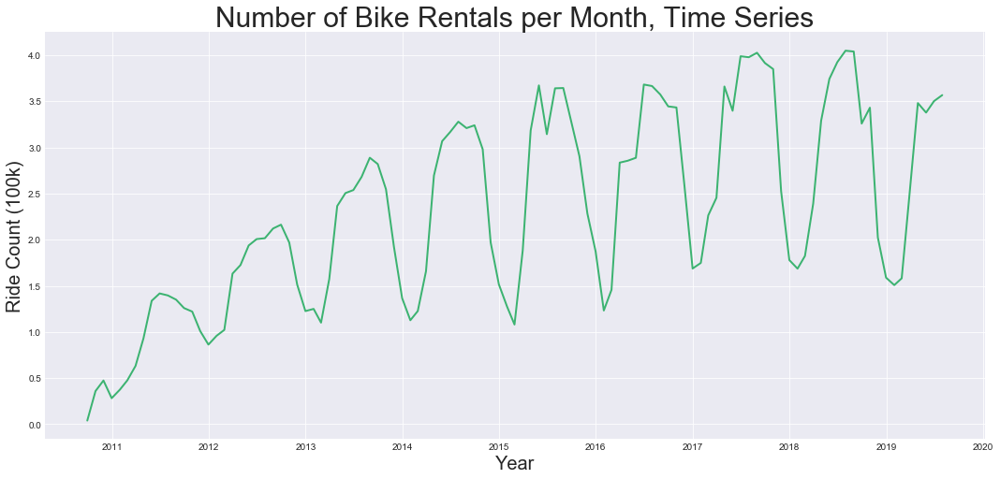

In [4]:
p.initial_plot(bike_df)

Before moving forward, we will divide the data into a 75% training dataset and a 25% testing dataset. We will then graph both to make sure that the split is functional.

In [5]:
train_df, test_df = f.train_split(bike_df)

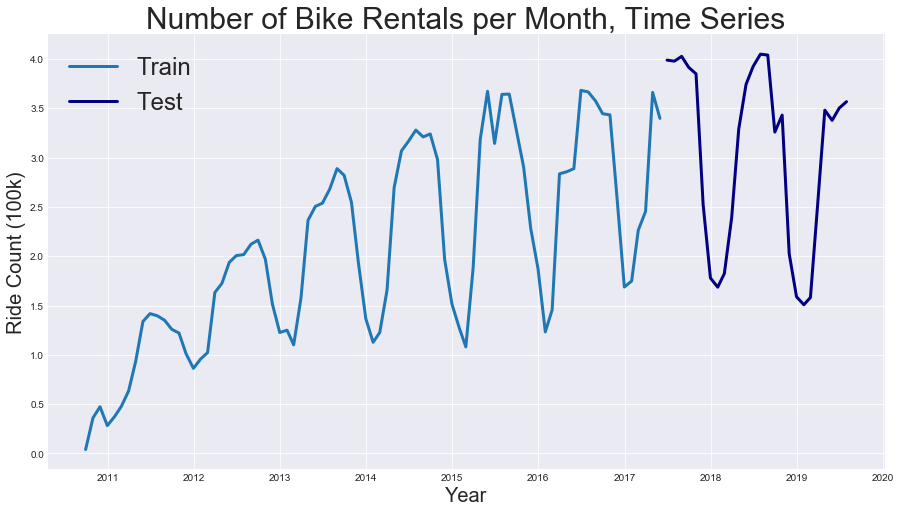

In [6]:
p.split_plot(train_df, test_df)

In order to determine whether there is either a trend or a seasonal fluctuation, we will create a decomposition.

<Figure size 432x288 with 0 Axes>

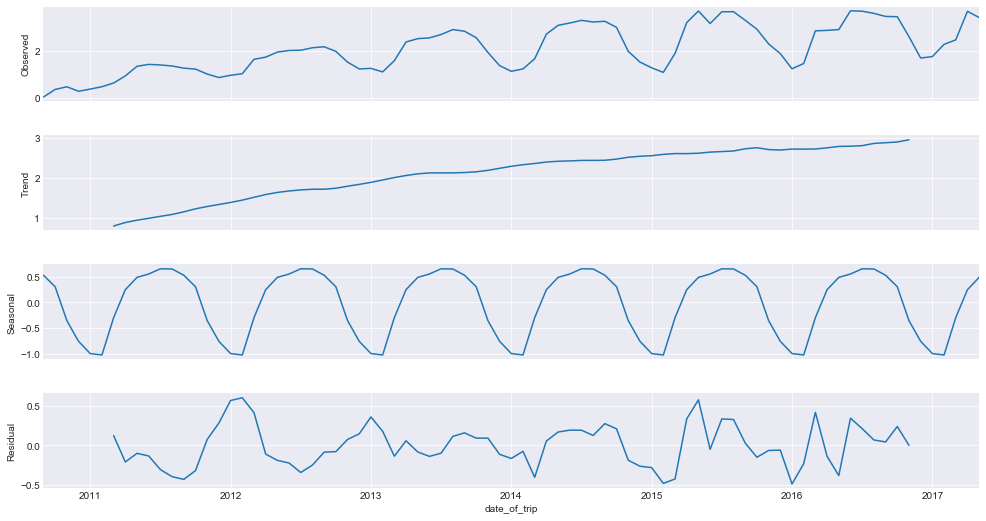

In [7]:
p.decomposition(train_df)

In order to test the stationarity of the time series, we will plot the rolling statistics and perform a Dickey-Fuller test on the original data, the first difference, the second difference, the seasonal difference of the original data, and the seasonal difference of the first difference. This is done to determine the number of regular and seasonal differences we will use in our predictive model.

We will also create autocorrelations and partial autocorrelations for each difference, for later use in determining the number of auto-regressive (AR) and moving-average (MA) terms to add to our prediction model.

## Original 

The purpose of this test is to determine the stationarity and autocorrelation
 of the original time series.


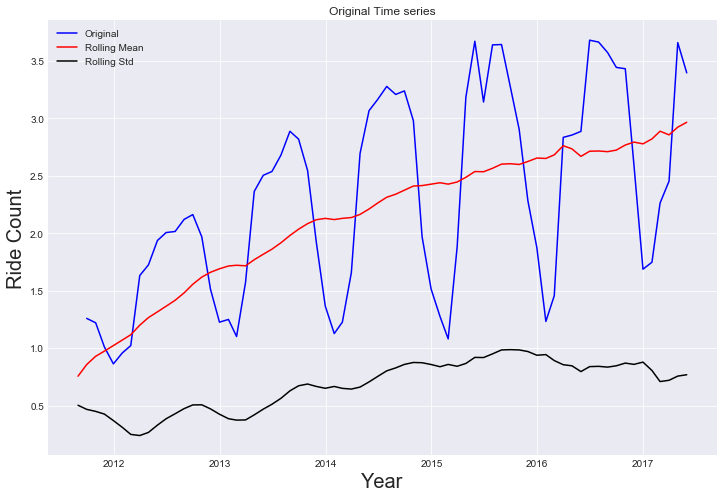

Results of Dickey-Fuller Test:
Test Statistic                 -4.065344
p-value                         0.001104
#Lags Used                     11.000000
Number of Observations Used    69.000000
Critical Value (1%)            -3.528890
Critical Value (5%)            -2.904440
Critical Value (10%)           -2.589656
dtype: float64


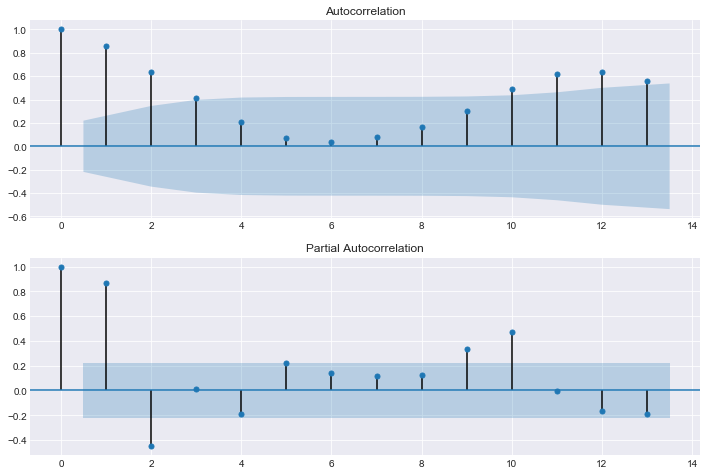

In [8]:
dt.stationarity_autocorrelation_test_original(train_df)

## First Order Difference

The purpose of this test is to determine the stationarity and autocorrelation
 of the first difference.


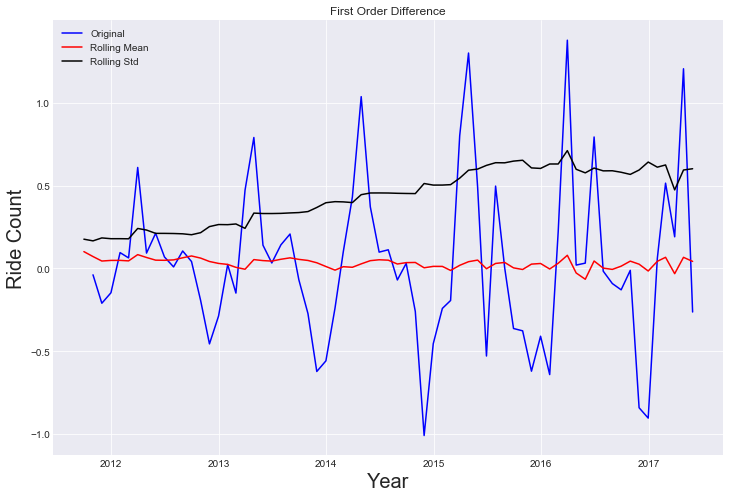

Results of Dickey-Fuller Test:
Test Statistic                 -3.316431
p-value                         0.014160
#Lags Used                     12.000000
Number of Observations Used    67.000000
Critical Value (1%)            -3.531955
Critical Value (5%)            -2.905755
Critical Value (10%)           -2.590357
dtype: float64


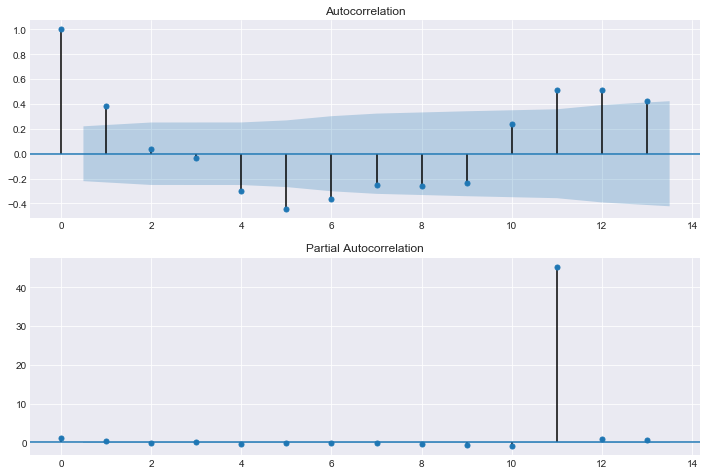

In [9]:
dt.stationarity_autocorrelation_test_first_diff(train_df)

## Second Order Difference 

The purpose of this test is to determine the stationarity and autocorrelation
 of the second difference.


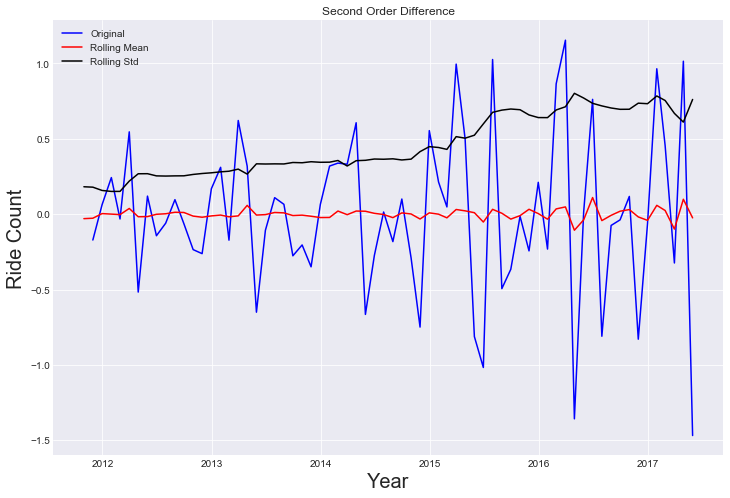

Results of Dickey-Fuller Test:
Test Statistic                -8.753455e+00
p-value                        2.796057e-14
#Lags Used                     1.100000e+01
Number of Observations Used    6.700000e+01
Critical Value (1%)           -3.531955e+00
Critical Value (5%)           -2.905755e+00
Critical Value (10%)          -2.590357e+00
dtype: float64


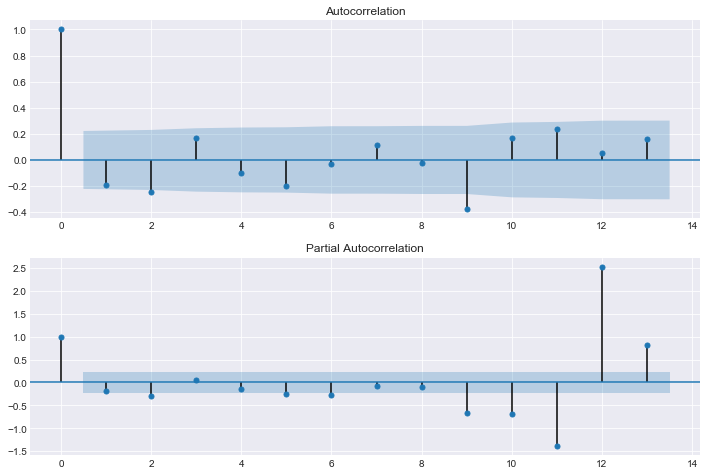

In [10]:
dt.stationarity_autocorrelation_test_second_diff(train_df)

Although the original graph has a low p-value, the graph suggests that the mean of the time series is not stationary. However, both the first and second orders appear stationary, and there is less than a 2% probability that either is not stationary, according to the p-value. Therefore, we will either have the non-seasonal data have 1 or 2 differences, depending, on whether the seasonal variability requires a difference.

## First Seasonal Difference 

The purpose of this test is to determine the stationarity and autocorrelation
 of the seasonal difference.


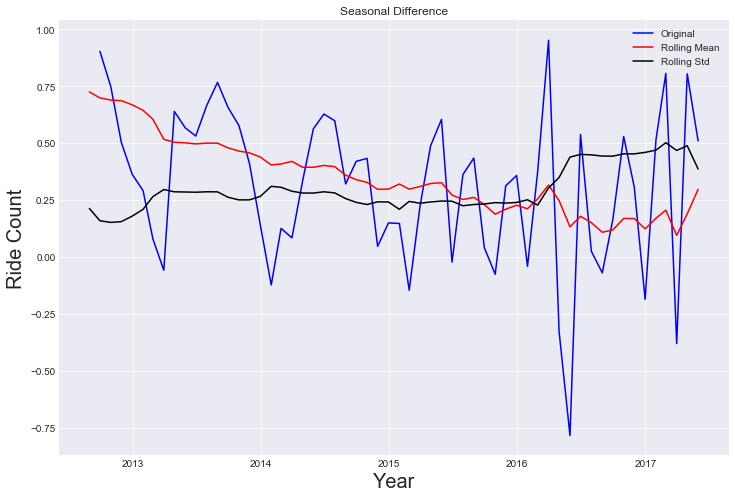

Results of Dickey-Fuller Test:
Test Statistic                 -1.953684
p-value                         0.307243
#Lags Used                      9.000000
Number of Observations Used    59.000000
Critical Value (1%)            -3.546395
Critical Value (5%)            -2.911939
Critical Value (10%)           -2.593652
dtype: float64


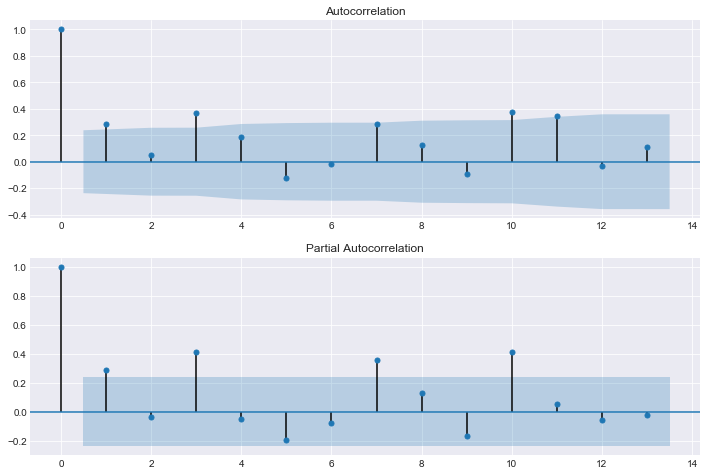

In [11]:
dt.stationarity_test_seasonal_diff(train_df)

## First Seasonal Difference of First Order Difference

The purpose of this test is to determine the stationarity and autocorrelation
 of the seasonal difference of the first difference.


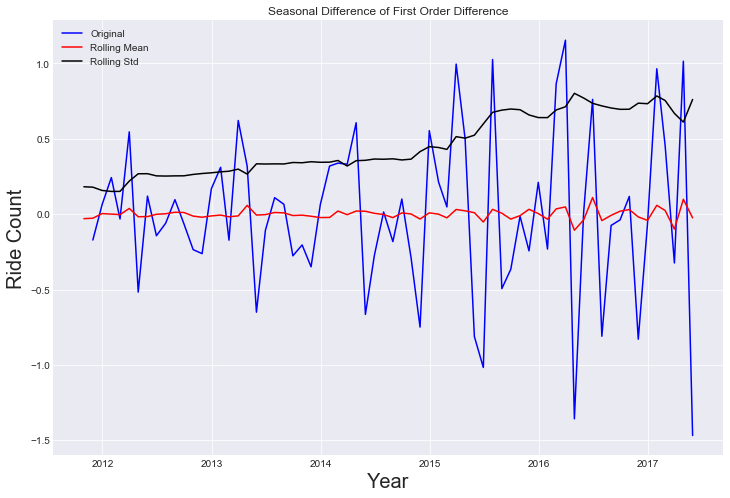

Results of Dickey-Fuller Test:
Test Statistic                -8.753455e+00
p-value                        2.796057e-14
#Lags Used                     1.100000e+01
Number of Observations Used    6.700000e+01
Critical Value (1%)           -3.531955e+00
Critical Value (5%)           -2.905755e+00
Critical Value (10%)          -2.590357e+00
dtype: float64


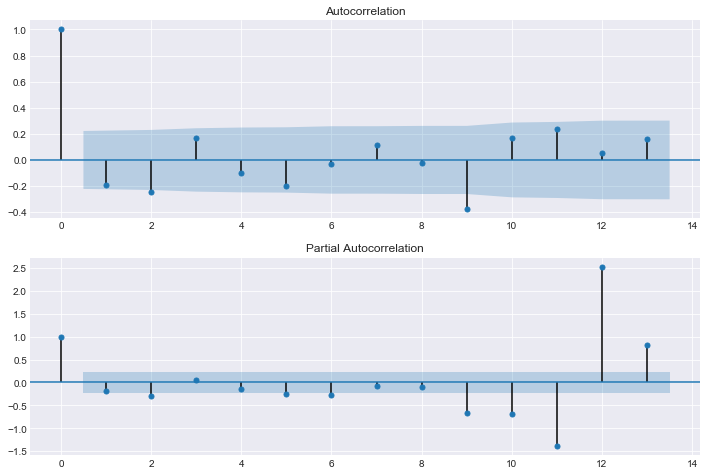

In [12]:
dt.stationarity_test_seasonal_first_diff(train_df)

The seasonal difference of the original dataset does not seem to have a stationary mean, and the p-value of the Dickey-Fuller tests is much greater than .05. Therefore, we can assume that it is not stationary. However, the seasonal regression of the first order difference appears stationary, and the Dickey-Fuller p-value is less than .05. This indicates that we should use one seasonal difference. Since we are using one seasonal difference, we should only use one regular difference in our model as well, in order to avoid over-fitting.

Since the partial autocorrelation of the first 2 lags appears somewhat significant for this scenario, we will model with 2 AR terms, while the ACF suggests between 1 and 3 MA terms. For the seasonal component of the model, we will try all combinations with 0 - 1 seasonal AR terms and 0 - 1 seasonal MA terms. The seasonal lag will be 12 months.

To make sure that this is correct, we will run SARIMA tests on all potential models with p = 2, d = 1, D = 1, and a 12-month seasonal cycle, on both our training and test data. We will compare results among all attempted models.

### Models to try:

    (2,1,0)(0,1,0,12)
    (2,1,0)(0,1,1,12)
    (2,1,0)(1,1,0,12)
    (2,1,1)(0,1,0,12)
    (2,1,1)(0,1,1,12)
    (2,1,1)(1,1,0,12)
    (2,1,2)(0,1,0,12)
    (2,1,2)(0,1,1,12)
    (2,1,2)(1,1,0,12)
    (2,1,3)(0,1,0,12)
    (2,1,3)(0,1,1,12)
    (2,1,3)(1,1,0,12)
    
The following function is written to evaluate all of these order/seasonal order combinations so that they can be compared

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -803.368
Date:                            Wed, 30 Oct 2019   AIC                           1612.736
Time:                                    19:04:05   BIC                           1619.394
Sample:                                09-30-2010   HQIC                          1615.374
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4843      0.066     -7.297      0.000      -0.614      -0.354
ar.L2         -0.5856      0.086   

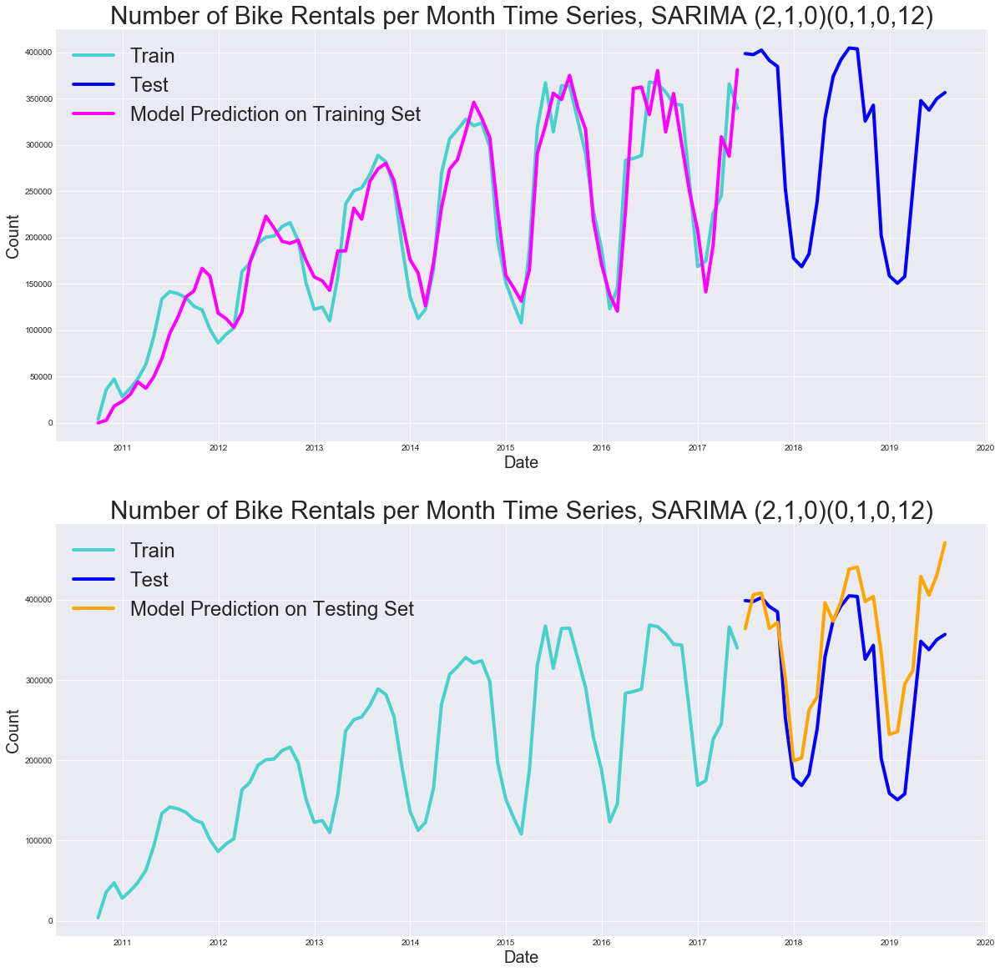

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -802.946
Date:                            Wed, 30 Oct 2019   AIC                           1613.891
Time:                                    19:04:05   BIC                           1622.769
Sample:                                09-30-2010   HQIC                          1617.409
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4403      0.080     -5.496      0.000      -0.597      -0.283
ar.L2         -0.5177      0.102   

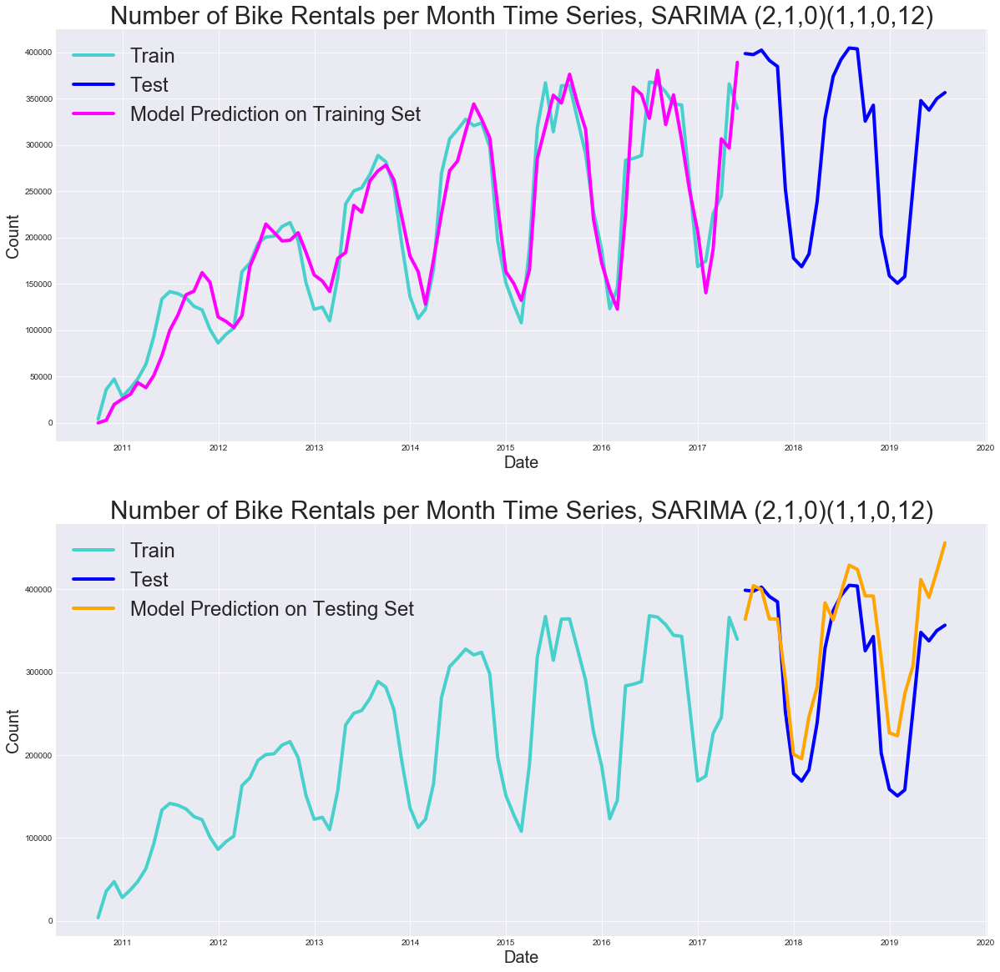

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(0, 1, 1, 12)   Log Likelihood                -812.543
Date:                            Wed, 30 Oct 2019   AIC                           1633.086
Time:                                    19:04:07   BIC                           1641.964
Sample:                                09-30-2010   HQIC                          1636.604
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0780      0.101      0.771      0.441      -0.120       0.276
ar.L2         -0.1748      0.111   

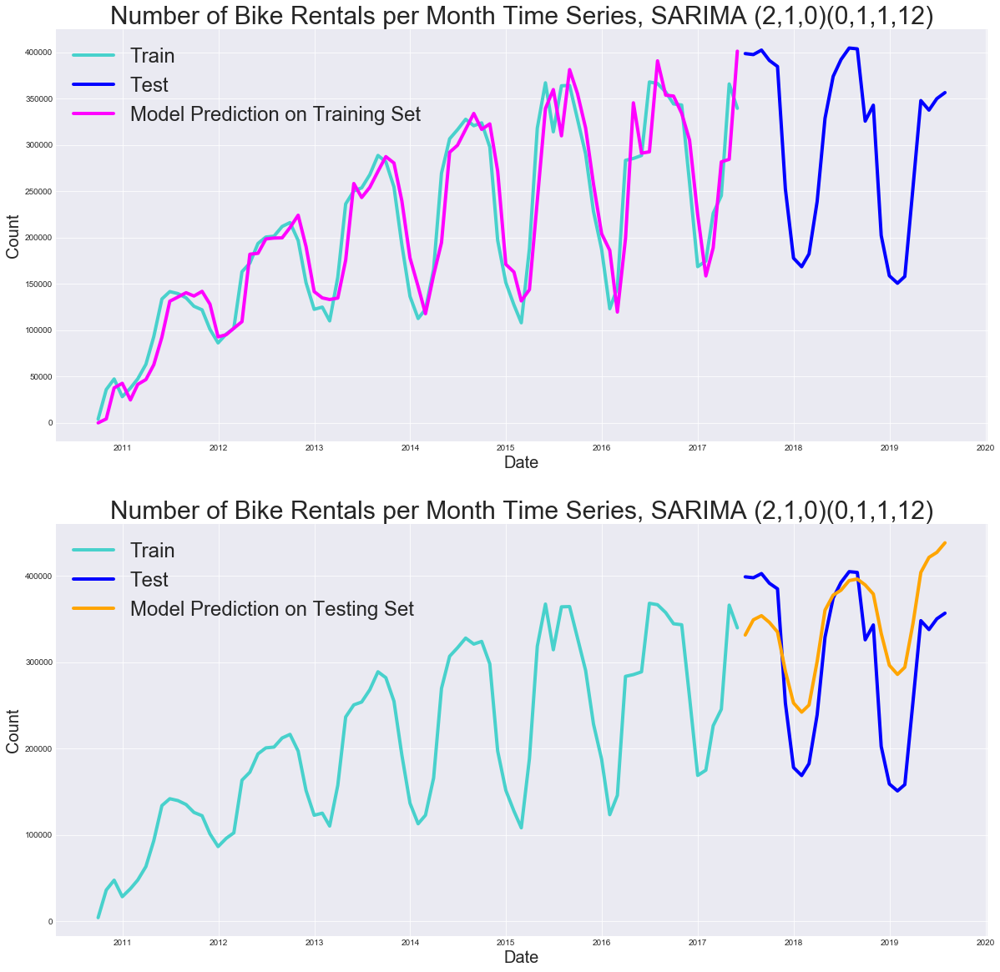

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(0, 1, 0, 12)   Log Likelihood                -803.140
Date:                            Wed, 30 Oct 2019   AIC                           1614.279
Time:                                    19:04:07   BIC                           1623.157
Sample:                                09-30-2010   HQIC                          1617.797
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5792      0.196     -2.959      0.003      -0.963      -0.196
ar.L2         -0.6246      0.107   

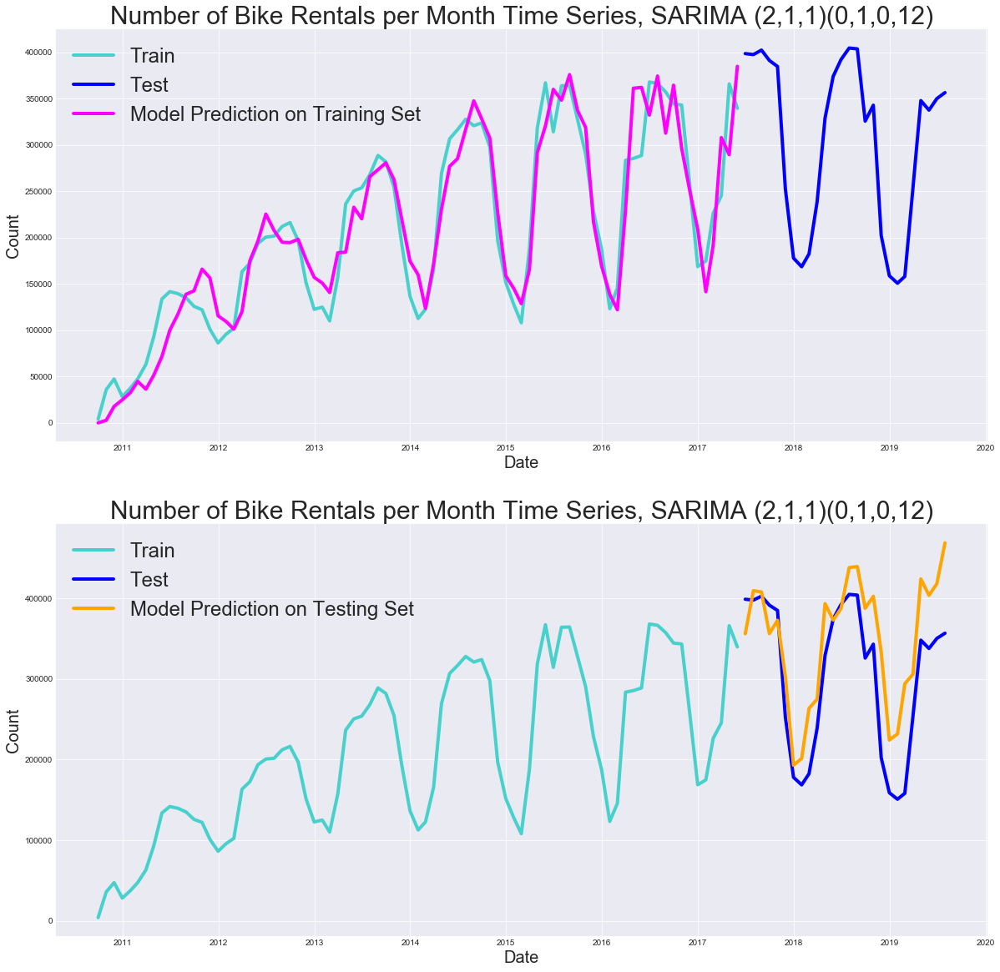

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(1, 1, 0, 12)   Log Likelihood                -802.543
Date:                            Wed, 30 Oct 2019   AIC                           1615.087
Time:                                    19:04:09   BIC                           1626.184
Sample:                                09-30-2010   HQIC                          1619.484
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5969      0.248     -2.410      0.016      -1.082      -0.111
ar.L2         -0.5633      0.129   

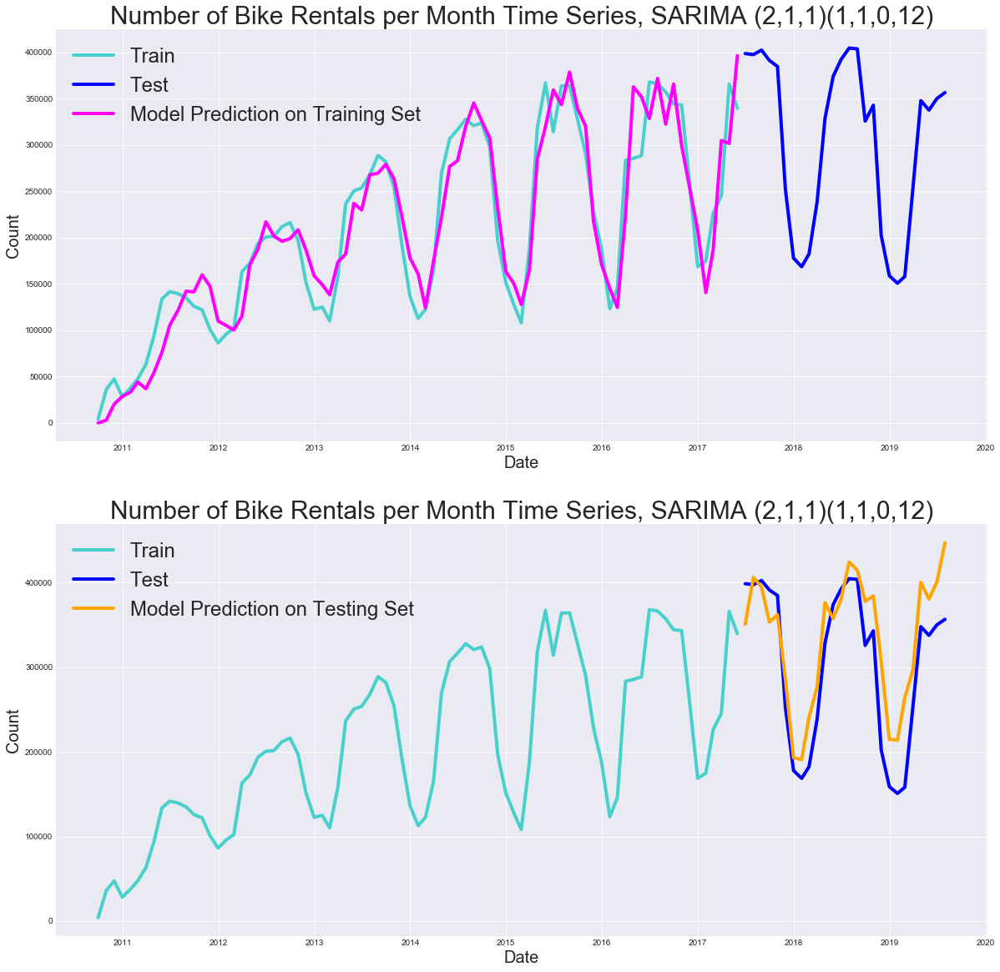

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -811.222
Date:                            Wed, 30 Oct 2019   AIC                           1632.443
Time:                                    19:04:10   BIC                           1643.541
Sample:                                09-30-2010   HQIC                          1636.841
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4805      0.396     -1.213      0.225      -1.257       0.296
ar.L2         -0.1940      0.149   

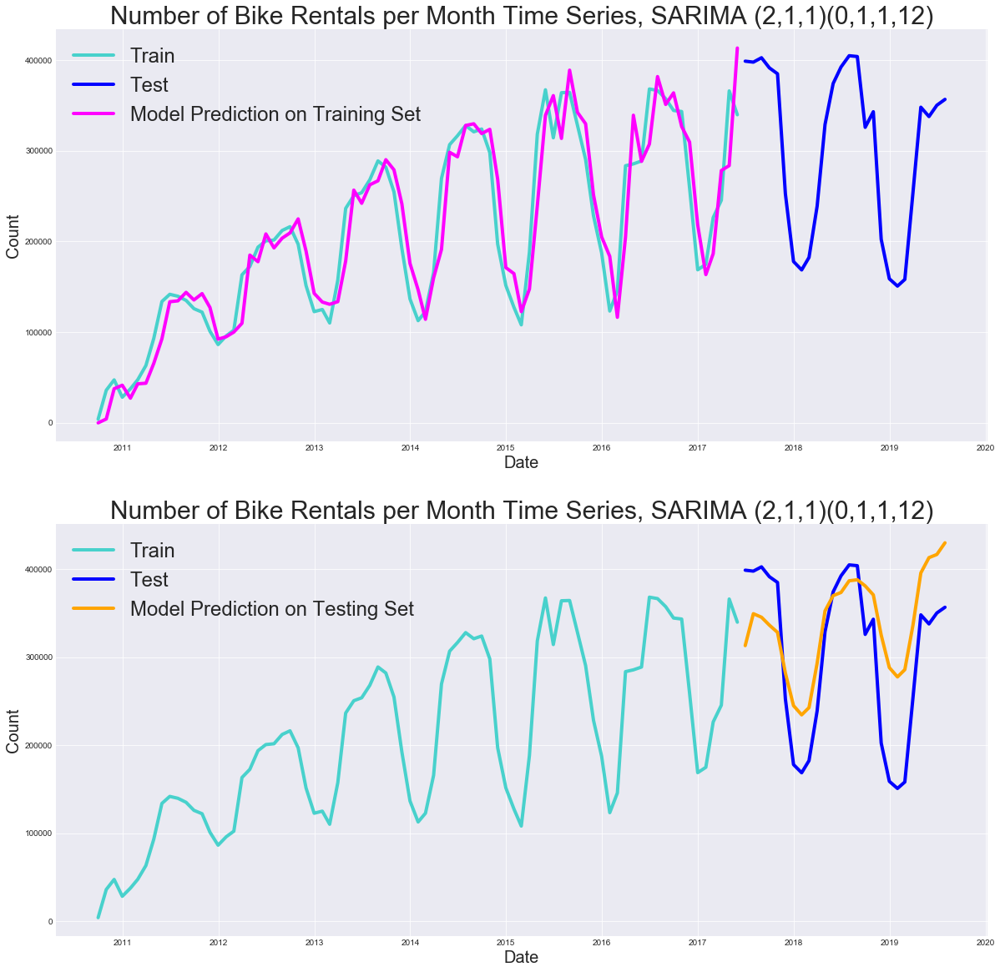

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(0, 1, 0, 12)   Log Likelihood                -799.240
Date:                            Wed, 30 Oct 2019   AIC                           1608.480
Time:                                    19:04:10   BIC                           1619.578
Sample:                                09-30-2010   HQIC                          1612.877
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4082      0.080     -5.106      0.000      -0.565      -0.251
ar.L2         -0.9379      0.052   

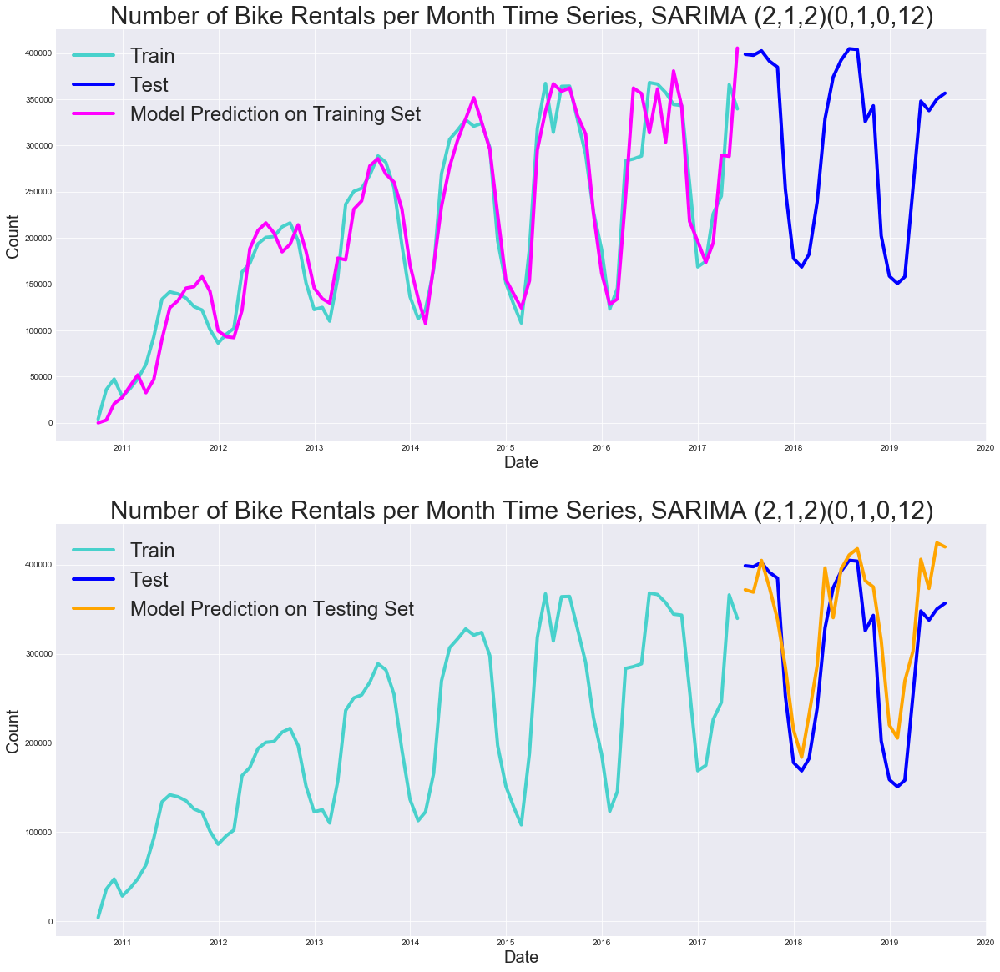

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(1, 1, 0, 12)   Log Likelihood                -799.011
Date:                            Wed, 30 Oct 2019   AIC                           1610.023
Time:                                    19:04:12   BIC                           1623.340
Sample:                                09-30-2010   HQIC                          1615.300
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3795      0.117     -3.252      0.001      -0.608      -0.151
ar.L2         -0.9177      0.065   

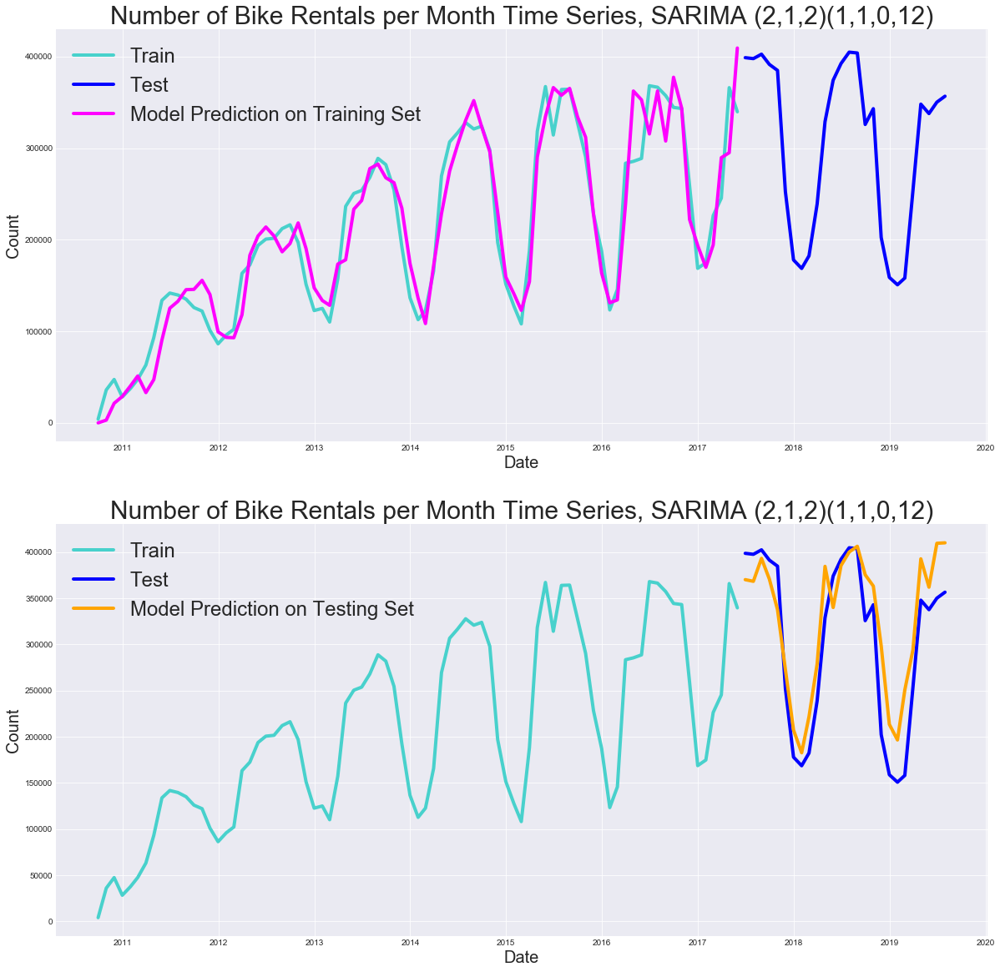

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 12)   Log Likelihood                -802.044
Date:                            Wed, 30 Oct 2019   AIC                           1616.088
Time:                                    19:04:14   BIC                           1629.405
Sample:                                09-30-2010   HQIC                          1621.364
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5021      0.028    -17.645      0.000      -0.558      -0.446
ar.L2         -1.0000      0.041   

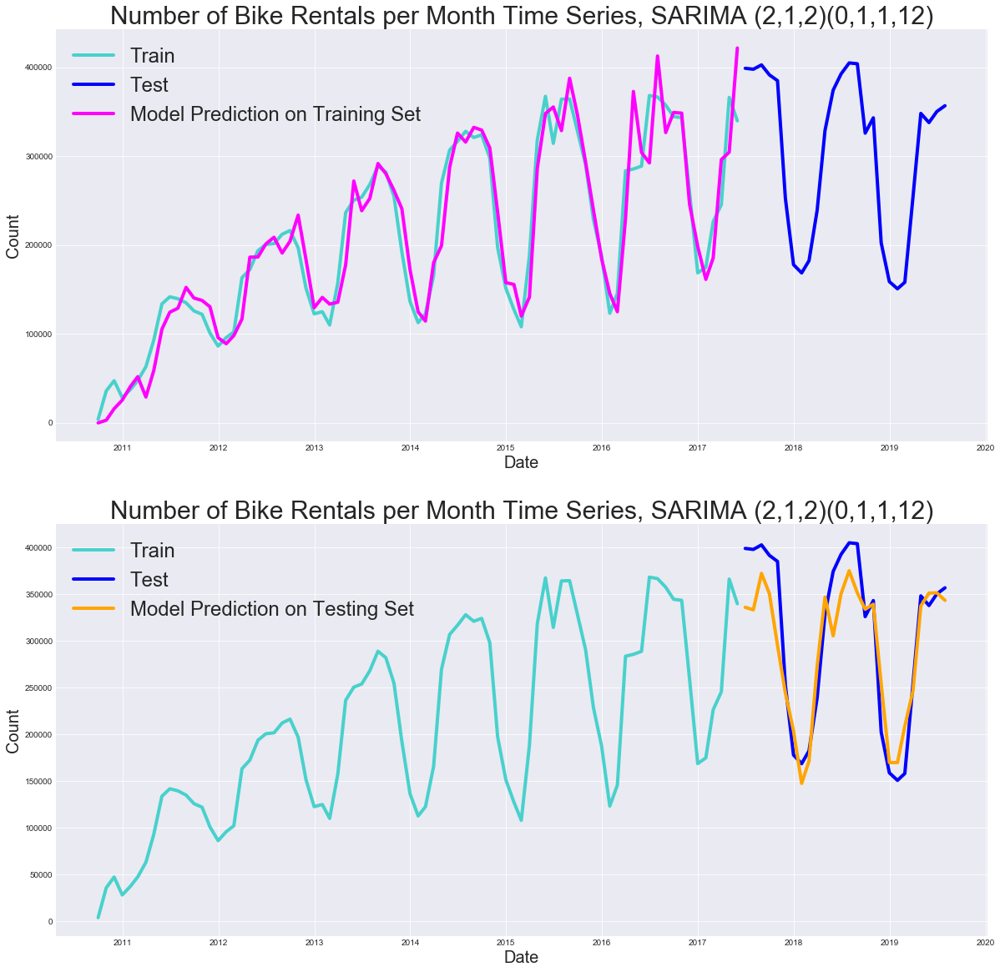

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(0, 1, 0, 12)   Log Likelihood                -794.695
Date:                            Wed, 30 Oct 2019   AIC                           1601.390
Time:                                    19:04:15   BIC                           1614.708
Sample:                                09-30-2010   HQIC                          1606.667
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4817      0.034    -14.377      0.000      -0.547      -0.416
ar.L2         -0.9998      0.038   

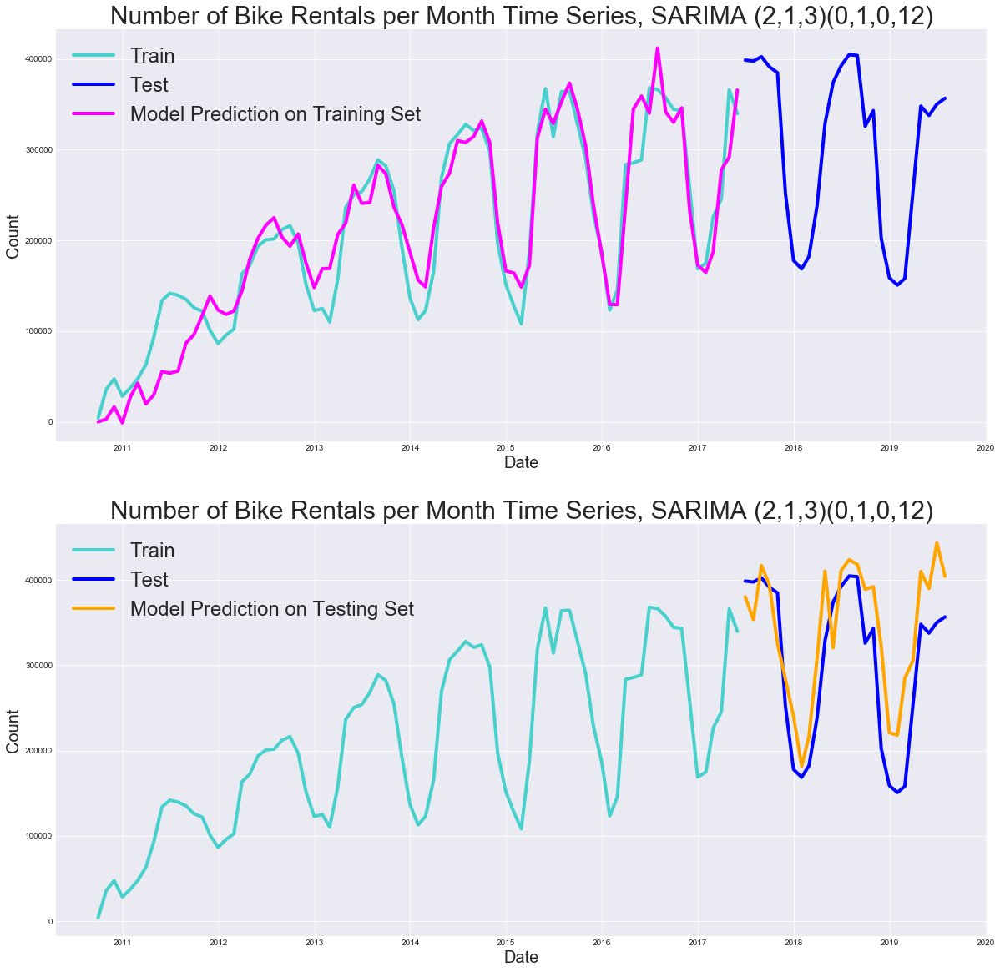

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(1, 1, 0, 12)   Log Likelihood                -794.511
Date:                            Wed, 30 Oct 2019   AIC                           1603.022
Time:                                    19:04:17   BIC                           1618.559
Sample:                                09-30-2010   HQIC                          1609.178
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4819      0.034    -14.087      0.000      -0.549      -0.415
ar.L2         -0.9985      0.041   

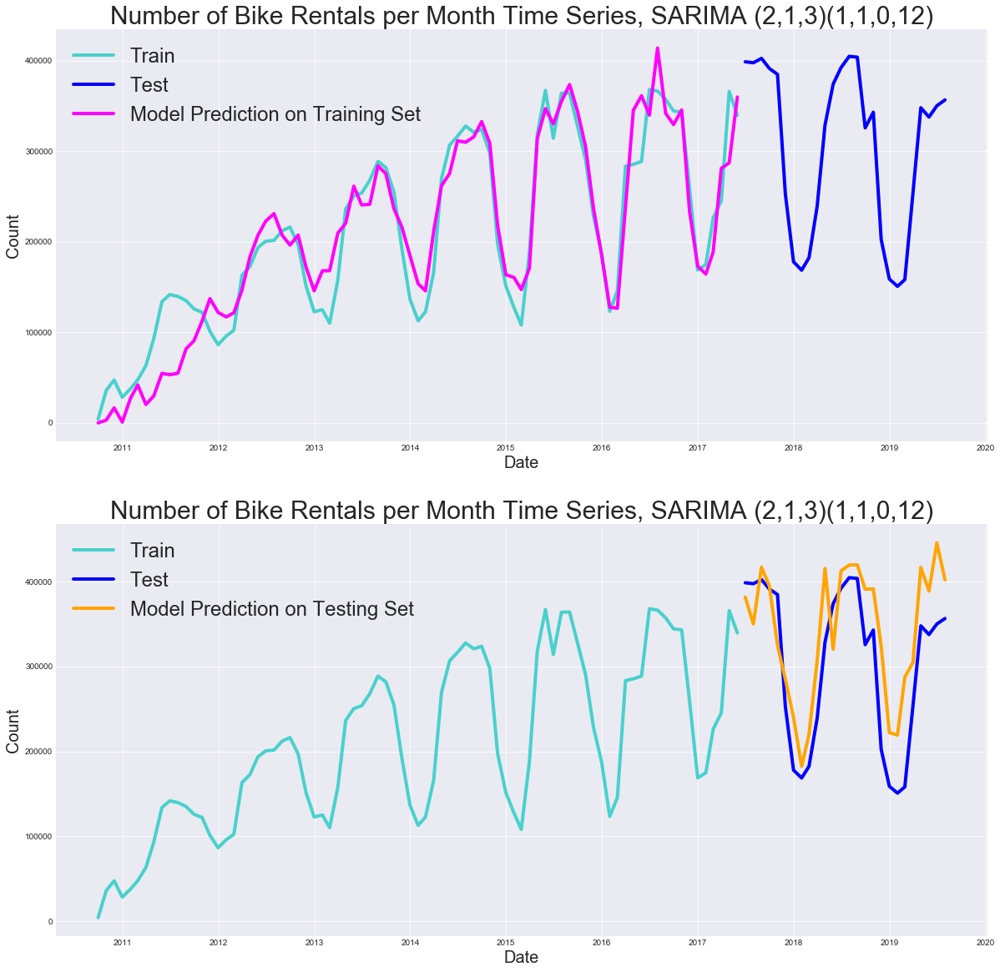

                                 Statespace Model Results                                 
Dep. Variable:                              count   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(0, 1, 1, 12)   Log Likelihood                -807.822
Date:                            Wed, 30 Oct 2019   AIC                           1629.645
Time:                                    19:04:19   BIC                           1645.181
Sample:                                09-30-2010   HQIC                          1635.801
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5021      0.037    -13.400      0.000      -0.576      -0.429
ar.L2         -0.9999      0.045   

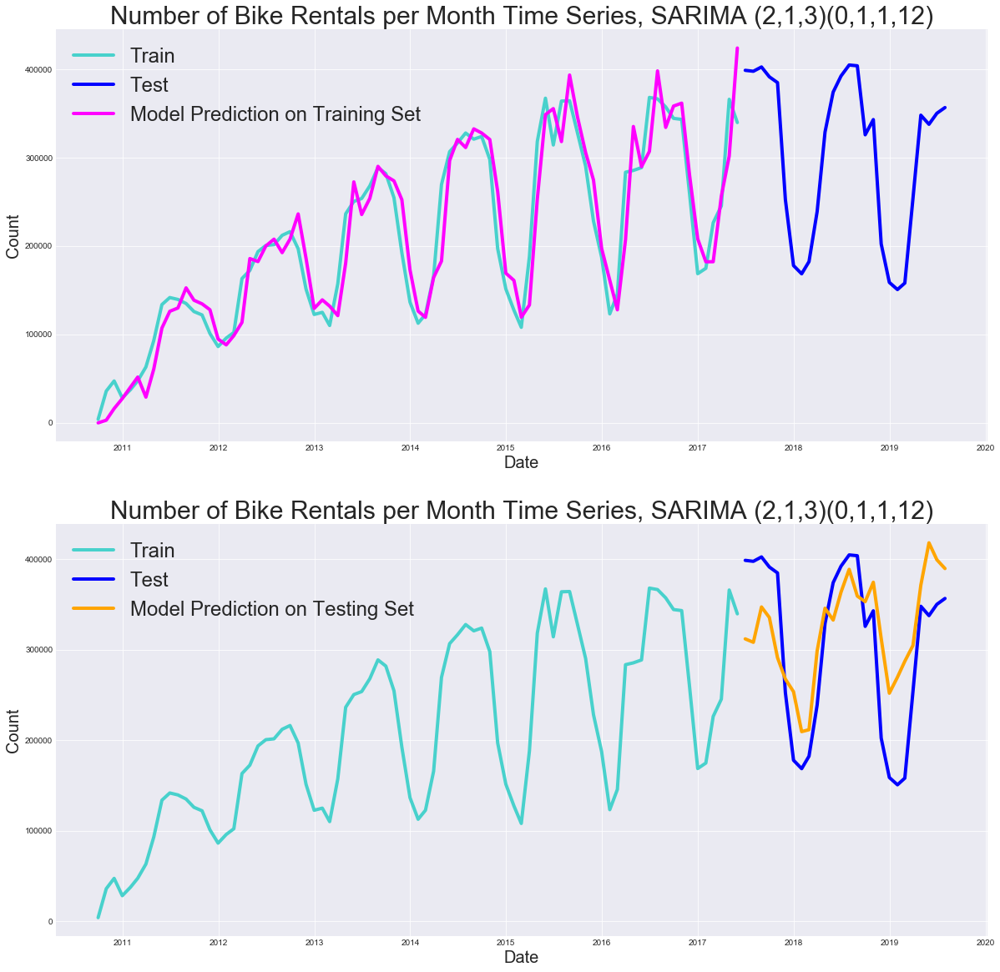

In [13]:
dt.sarima(train_df, test_df)

## Initial Modeling Results

The (2, 1, 2), (0, 1, 1, 12) model has the lowest MSE for the test data, indicating that this is the model that we should use. Based on this result, we will create a 12-month forecast of the original dataset, including an 80% prediction interval. First, we will take a look at residual normality to make sure this model is valid. 

In [14]:
model_212_01112 = sm.tsa.statespace.SARIMAX(bike_df['count'], trend='n', order=(2, 1, 2),
                                            seasonal_order=(0, 1, 1, 12)).fit()

In [15]:
model_212_01112.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                              count   No. Observations:                  107
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 12)   Log Likelihood               -1102.002
Date:                            Wed, 30 Oct 2019   AIC                           2216.003
Time:                                    19:04:22   BIC                           2231.263
Sample:                                09-30-2010   HQIC                          2222.167
                                     - 07-31-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2281      0.054     -4.217      0.000      -0.334      -0.122
ar.L2         -0.9285      0.049    -18.882      0.000      -1.025      -0.832
ma.L1          0.0006      0.060      0.011      0.991      -0.117       0.119
ma.L2          0.9319      0.083     11.197      0.000       0.769       1.095
ma.S.L12      -0.3359      0.132     -2.552      0.011      -0.594      -0.078
sigma2      1.061e+09   1.36e-11   7.81e+19      0.000    1.06e+09    1.06e+09
===================================================================================
Ljung-Box (Q):                       54.03   Jarque-Bera (JB):                 0.17
Prob(Q):                              0.07   Prob(JB):                         0.92
Heteroskedasticity (H):               1.48   Skew:                            -0.03
Prob(H) (two-sided):                  0.28   Kurtosis:                         3.20
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.82e+36. Standard errors may be unstable.
"""

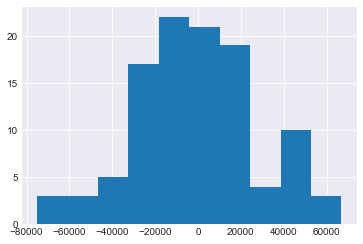

In [16]:
model_212_01112.resid.hist()

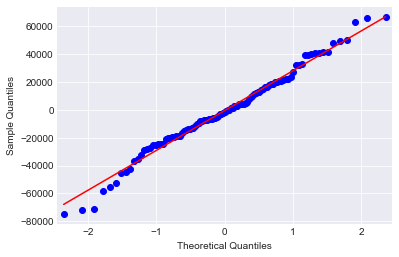

In [17]:
qqplot(model_212_01112.resid, line='s');

#  Forecast

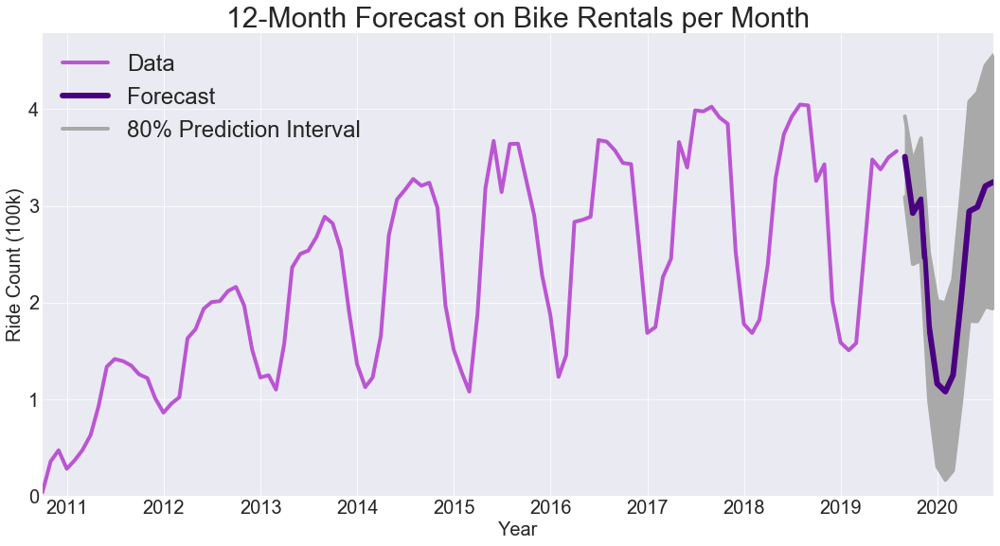

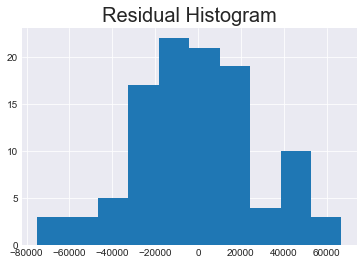

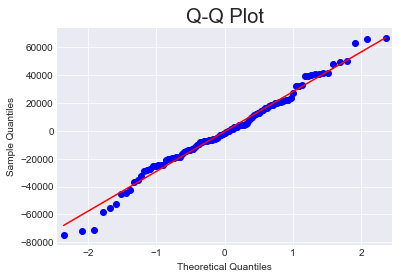

In [18]:
p.forecast_plot(model_212_01112, bike_df, 12)

From this, we can see that there is still a lot of variance in the prediction interval. A logical next step is to consider trends in rentals grouped as either casual or member rentals. From this point on, we will divide the dataset into 'Member' and 'Casual' (one-time bicycle renters).

## Member/Casual Rental Breakdown

The following functions and lines of code re-clean the data, this time breaking the datasets down according to member vs. casual rentals per month. We will now download data grouped by membership, graph it, and split it into the 75%-25% train-test group.

In [31]:
dp.save_master_breakdown_df()

In [20]:
bike_rental_type = f.master_breakdown()

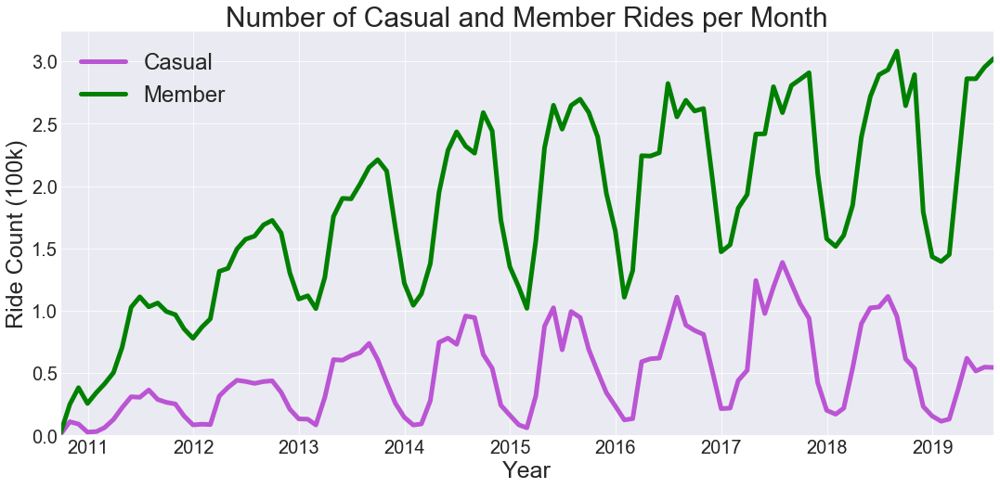

In [21]:
p.initial_breakdown_graph(bike_rental_type)

In [22]:
breakdown_train, breakdown_test = f.train_split(
    bike_rental_type, train_percent=.75)

The following code repeats analysis of the model combinations from before, this time running a model for Member rentals and a separate model for Casual rentals. For each model combination, the member model is run followed immediately by the casual model.

Orders: (2, 1, 0). Seasonal Orders: (0, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -775.270
Date:                            Wed, 30 Oct 2019   AIC                           1556.540
Time:                                    19:07:31   BIC                           1563.199
Sample:                                09-30-2010   HQIC                          1559.179
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4068      0.079     -5.136      0.000      -0.5

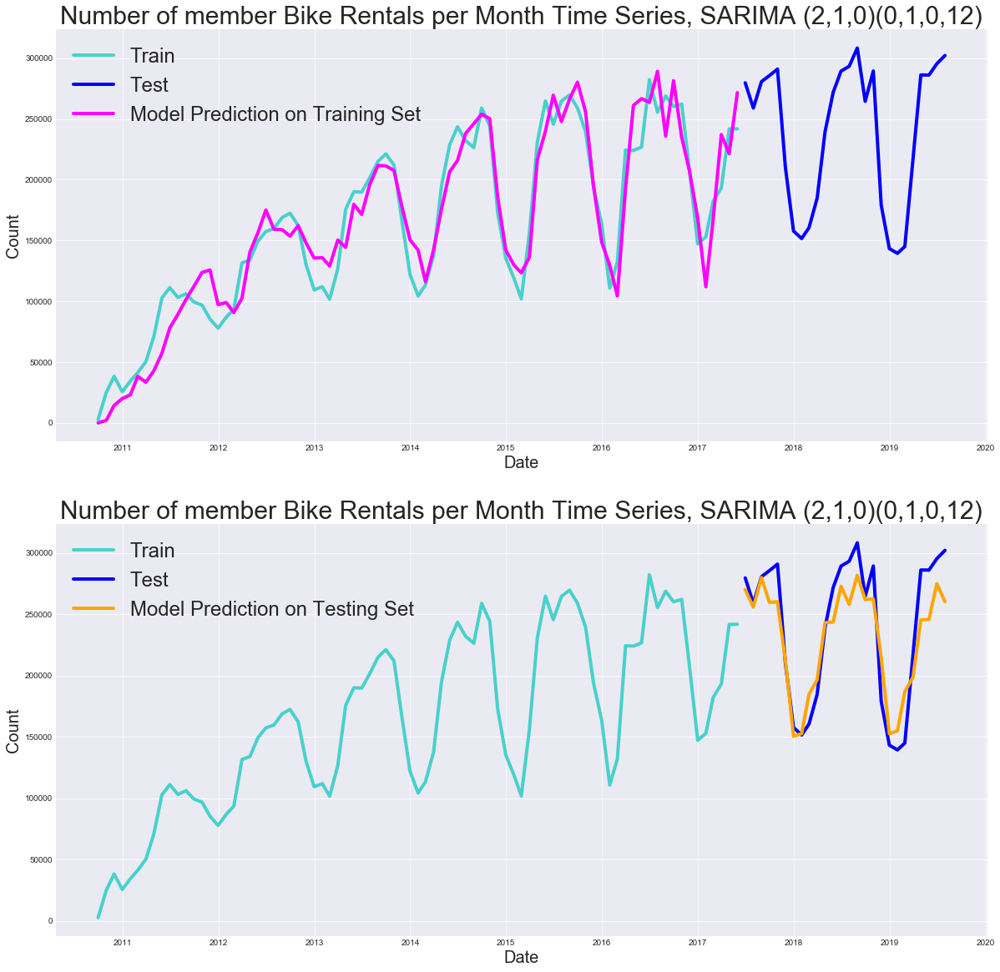

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -748.361
Date:                            Wed, 30 Oct 2019   AIC                           1502.721
Time:                                    19:07:32   BIC                           1509.380
Sample:                                09-30-2010   HQIC                          1505.360
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5329      0.075     -7.103      0.000      -0.680      -0.386
ar.L2         -0.4762      0.112   

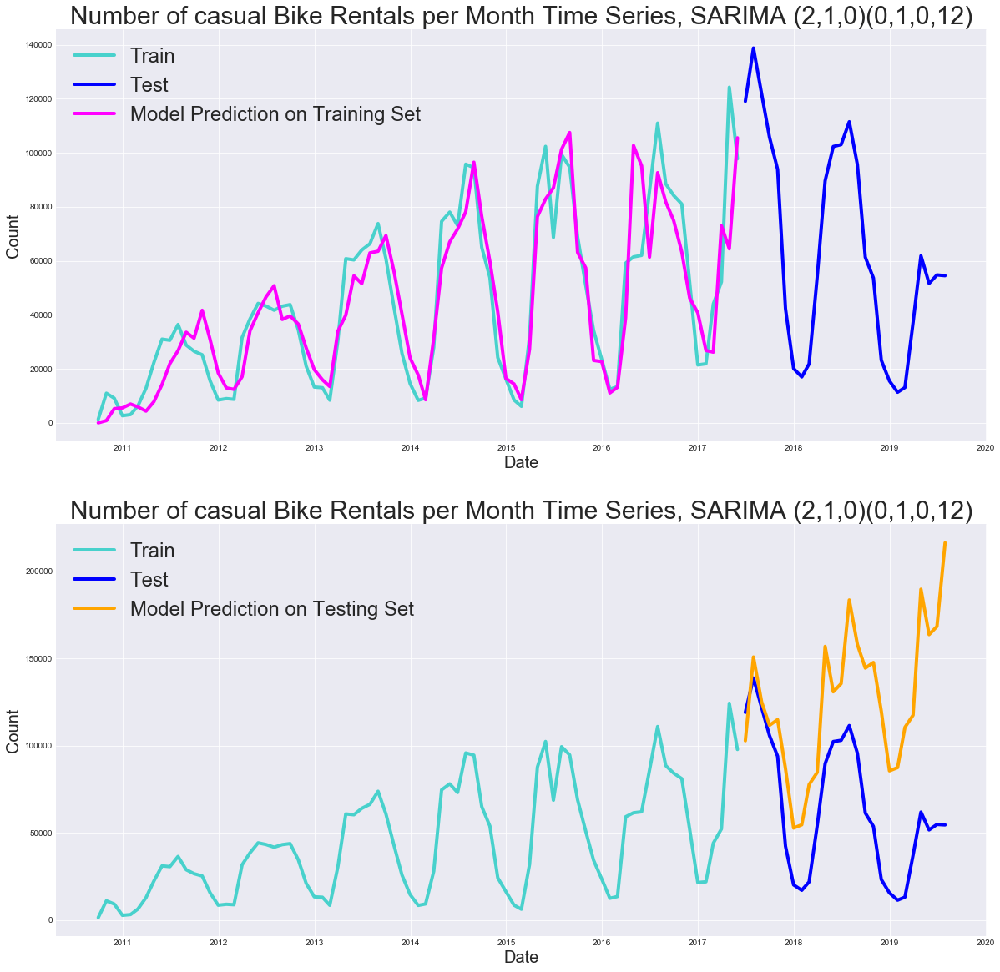

Orders: (2, 1, 0). Seasonal Orders: (1, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -775.042
Date:                            Wed, 30 Oct 2019   AIC                           1558.085
Time:                                    19:07:33   BIC                           1566.963
Sample:                                09-30-2010   HQIC                          1561.603
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3740      0.091     -4.116      0.000      -0.5

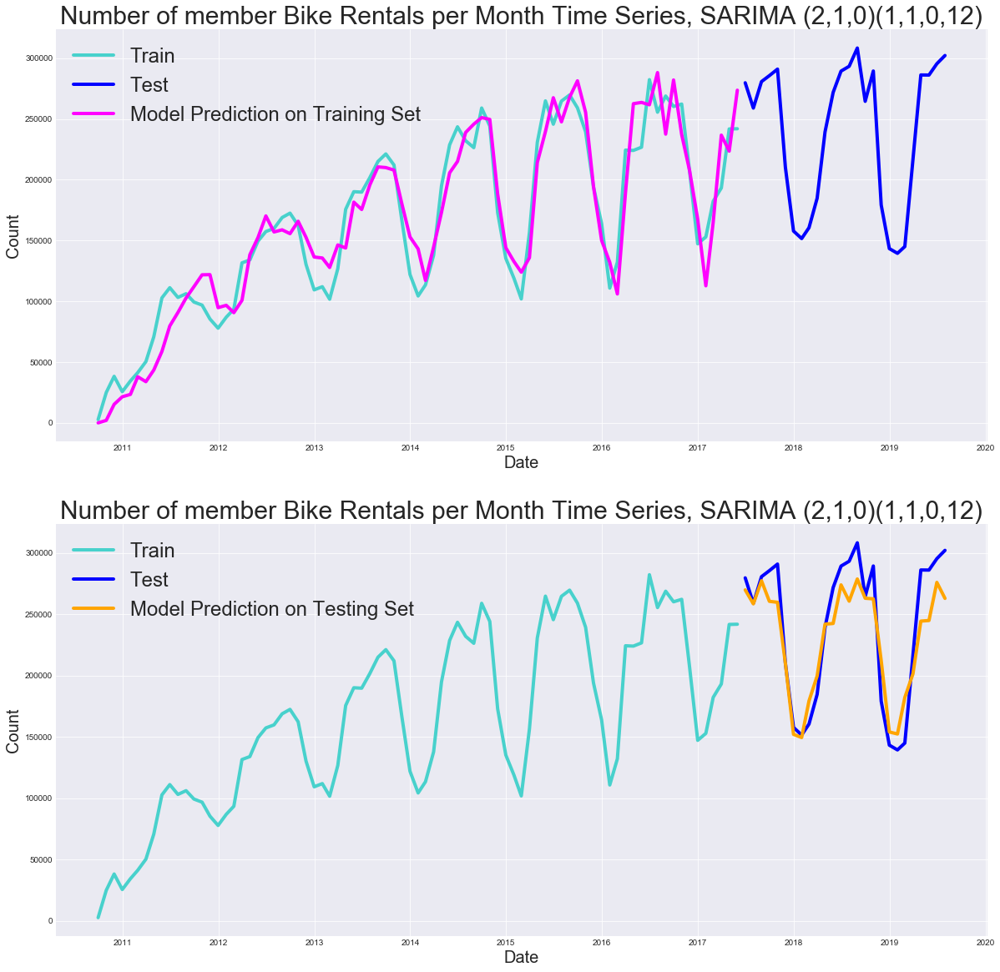

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -746.108
Date:                            Wed, 30 Oct 2019   AIC                           1500.216
Time:                                    19:07:34   BIC                           1509.094
Sample:                                09-30-2010   HQIC                          1503.733
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4677      0.099     -4.744      0.000      -0.661      -0.274
ar.L2         -0.3839      0.118   

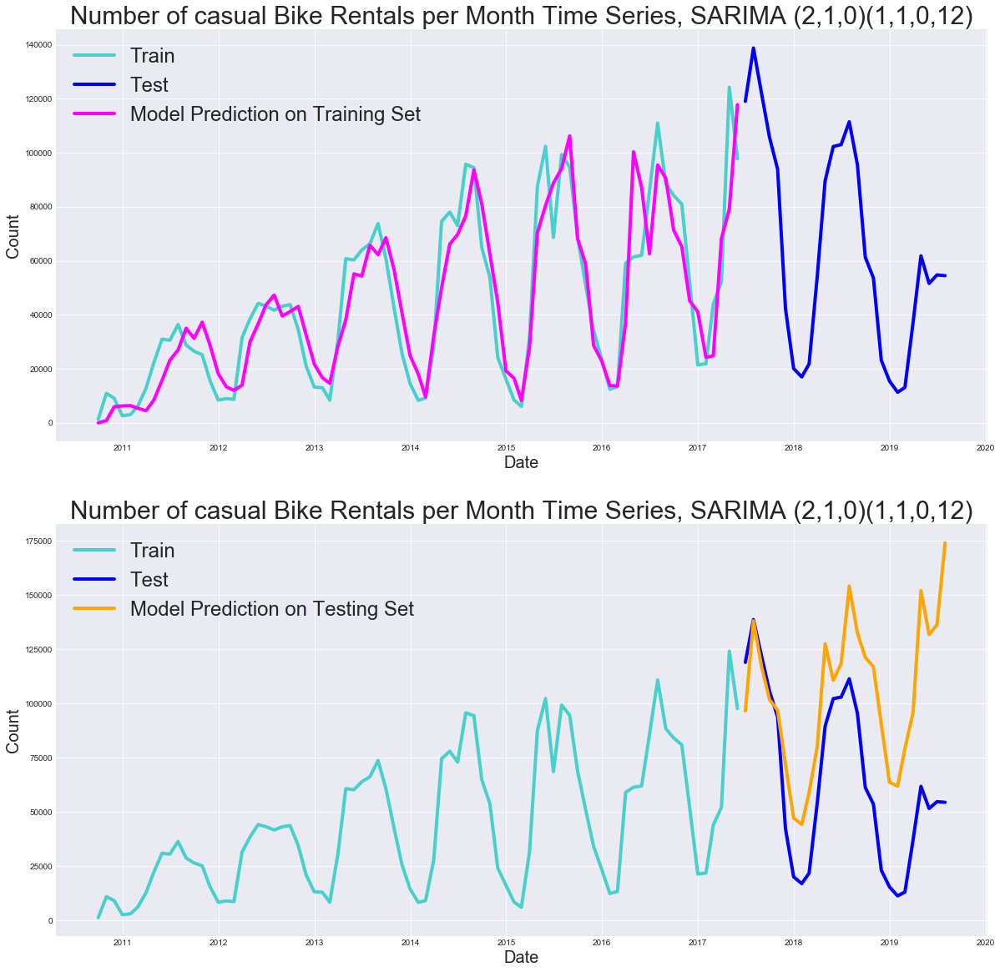

Orders: (2, 1, 0). Seasonal Orders: (0, 1, 1, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(0, 1, 1, 12)   Log Likelihood                -774.995
Date:                            Wed, 30 Oct 2019   AIC                           1557.991
Time:                                    19:07:34   BIC                           1566.869
Sample:                                09-30-2010   HQIC                          1561.509
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3665      0.092     -3.980      0.000      -0.5

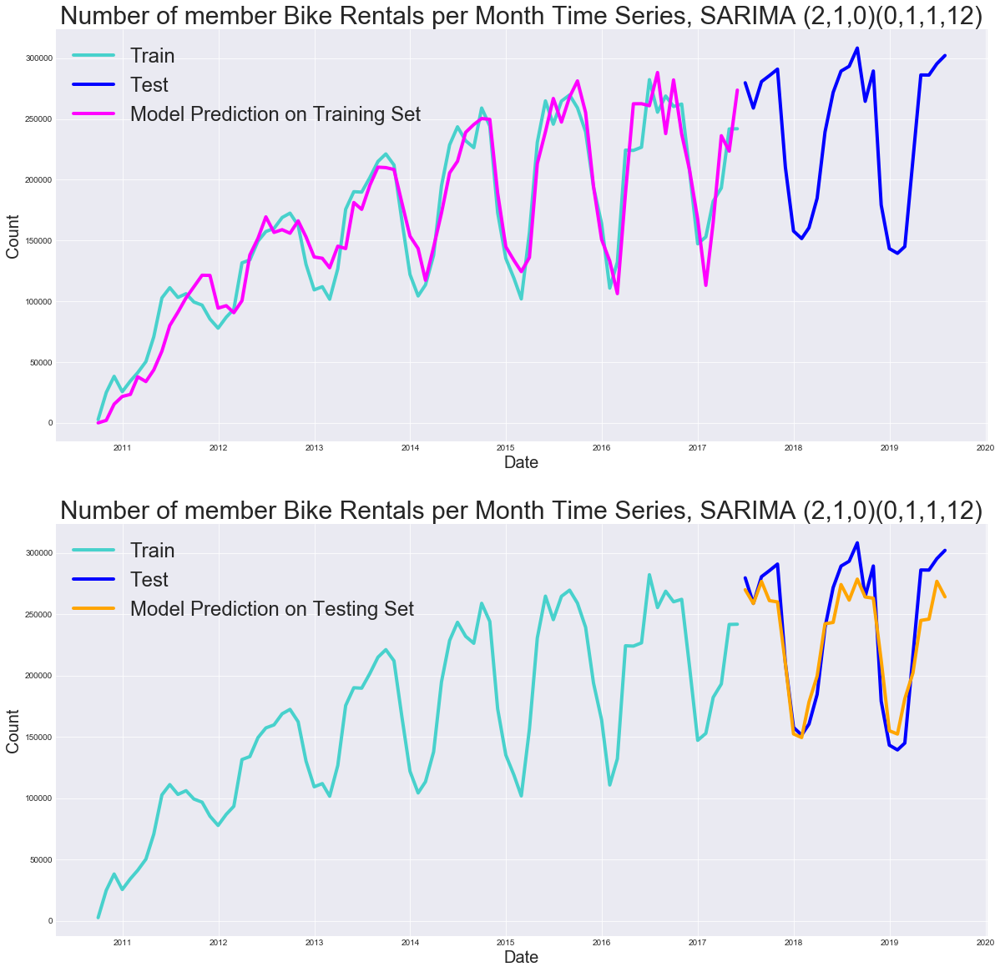

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 0)x(0, 1, 1, 12)   Log Likelihood                -746.437
Date:                            Wed, 30 Oct 2019   AIC                           1500.875
Time:                                    19:07:36   BIC                           1509.753
Sample:                                09-30-2010   HQIC                          1504.393
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4609      0.105     -4.388      0.000      -0.667      -0.255
ar.L2         -0.3959      0.120   

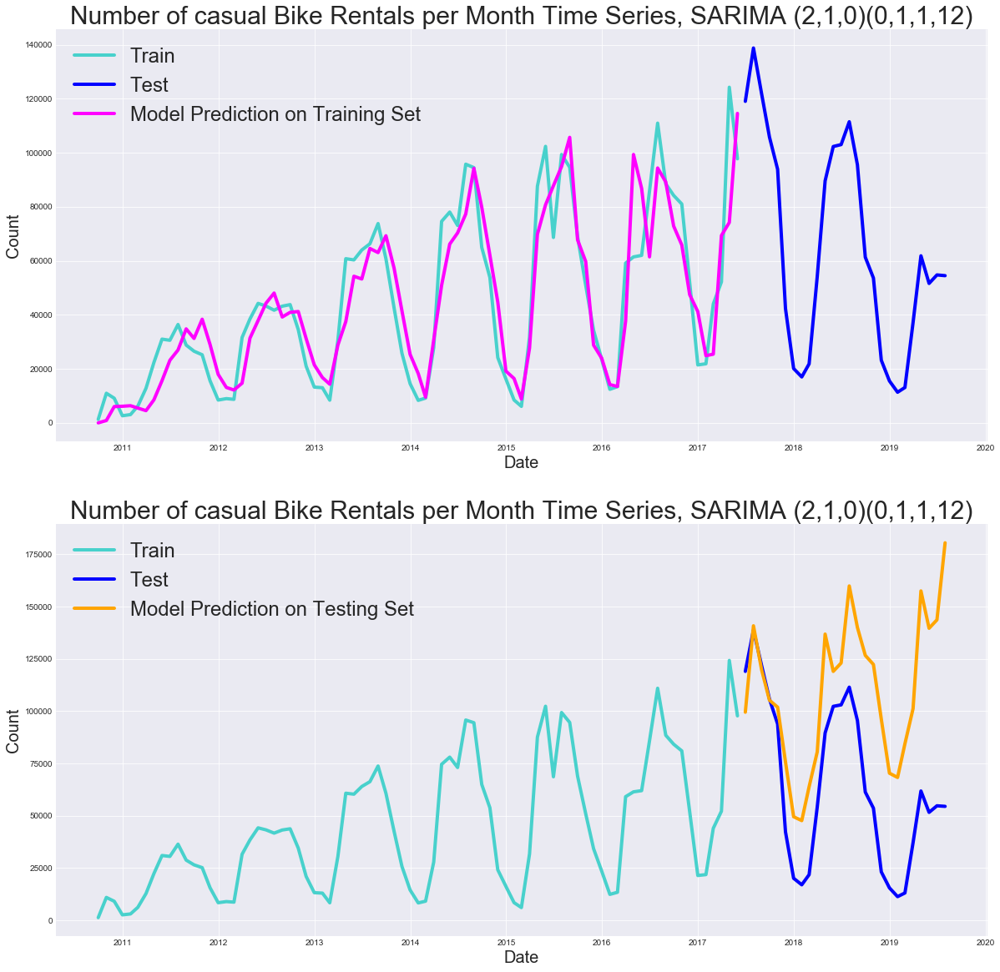

Orders: (2, 1, 1). Seasonal Orders: (0, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(0, 1, 0, 12)   Log Likelihood                -775.025
Date:                            Wed, 30 Oct 2019   AIC                           1558.050
Time:                                    19:07:37   BIC                           1566.928
Sample:                                09-30-2010   HQIC                          1561.568
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5009      0.154     -3.251      0.001      -0.8

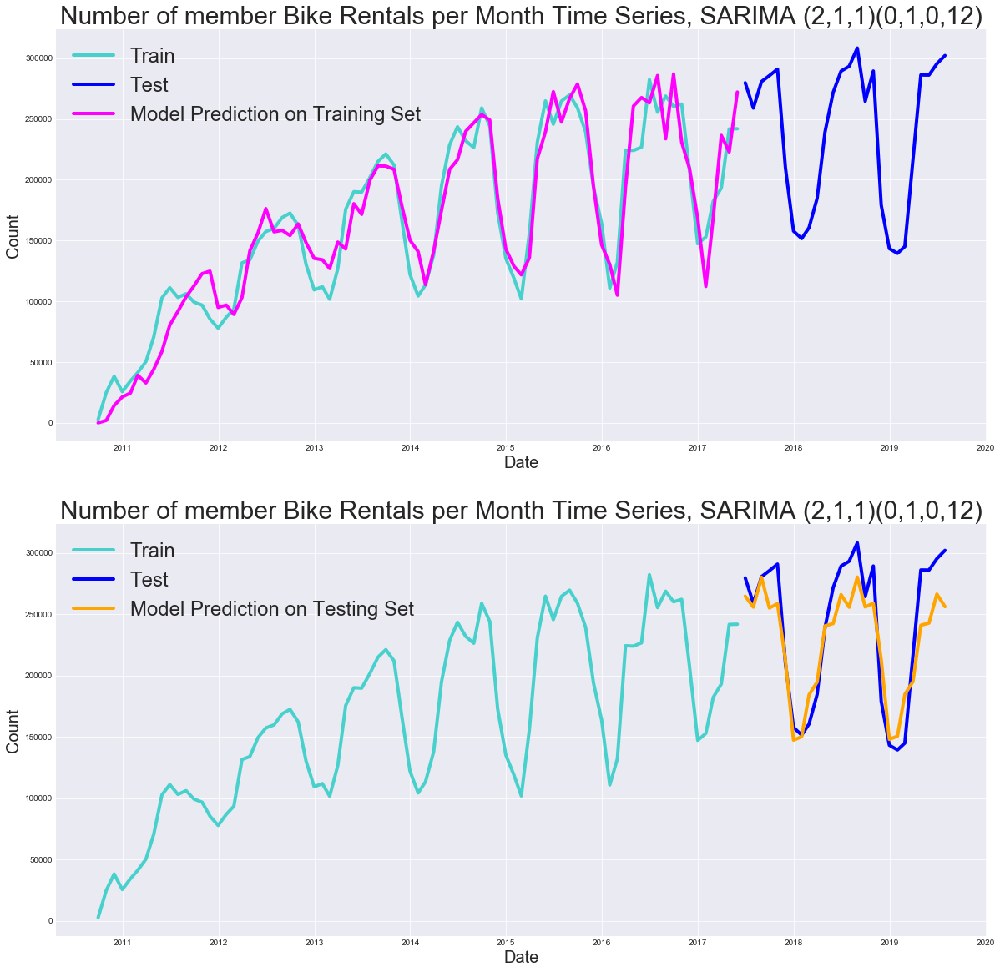

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(0, 1, 0, 12)   Log Likelihood                -748.350
Date:                            Wed, 30 Oct 2019   AIC                           1504.699
Time:                                    19:07:38   BIC                           1513.577
Sample:                                09-30-2010   HQIC                          1508.217
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4952      0.313     -1.581      0.114      -1.109       0.119
ar.L2         -0.4600      0.197   

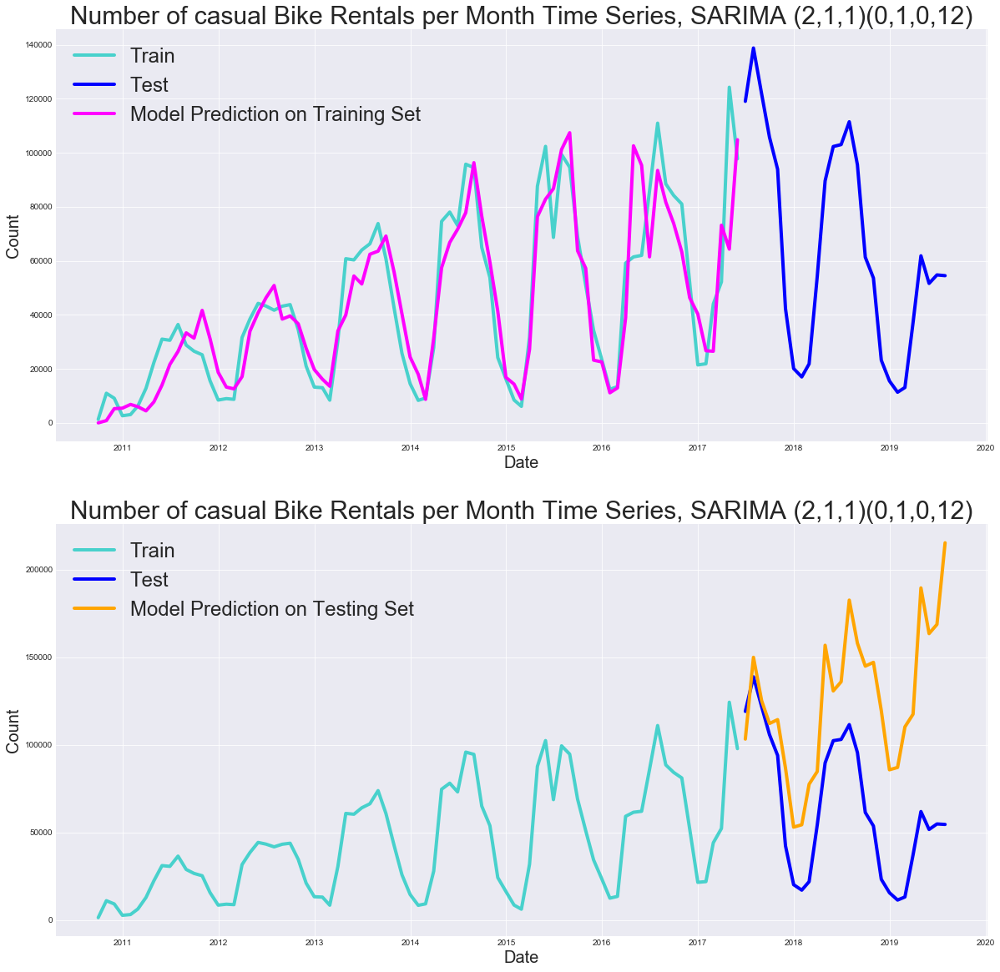

Orders: (2, 1, 1). Seasonal Orders: (1, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(1, 1, 0, 12)   Log Likelihood                -774.666
Date:                            Wed, 30 Oct 2019   AIC                           1559.333
Time:                                    19:07:39   BIC                           1570.430
Sample:                                09-30-2010   HQIC                          1563.730
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5121      0.181     -2.829      0.005      -0.8

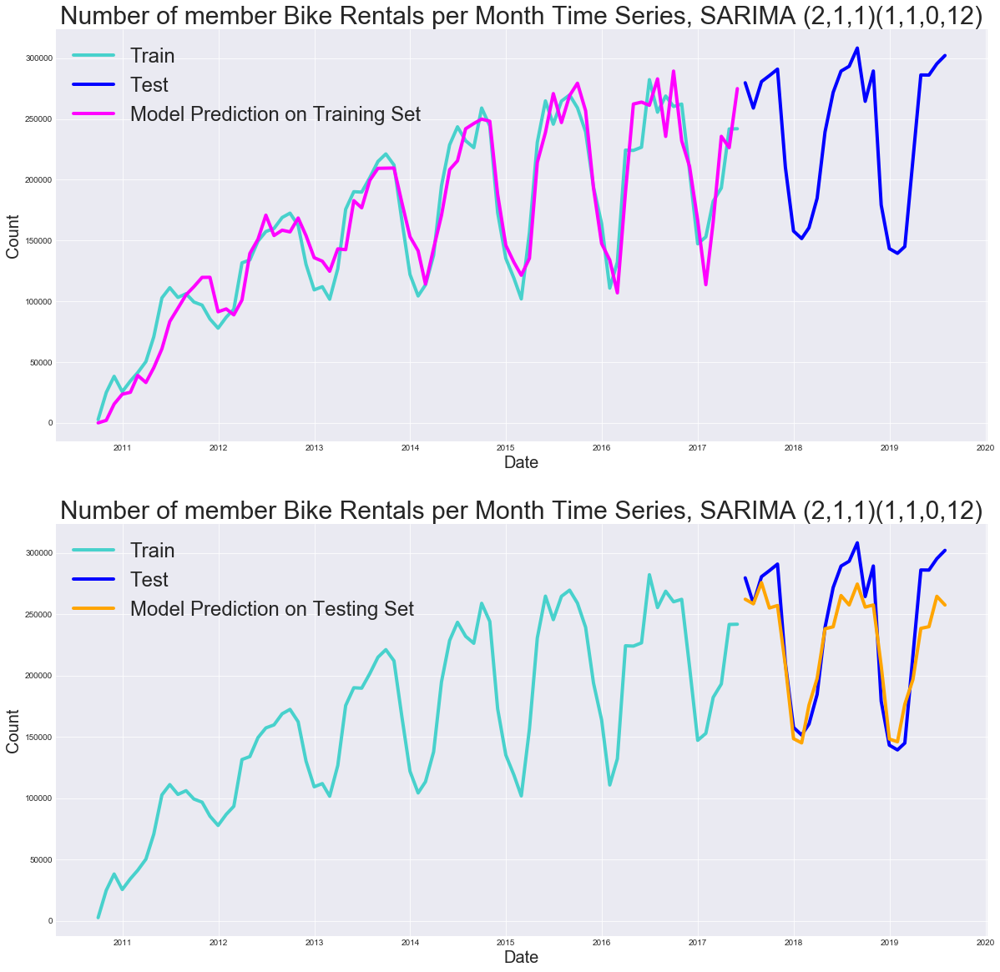

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(1, 1, 0, 12)   Log Likelihood                -746.151
Date:                            Wed, 30 Oct 2019   AIC                           1502.302
Time:                                    19:07:40   BIC                           1513.400
Sample:                                09-30-2010   HQIC                          1506.699
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4825      0.392     -1.232      0.218      -1.250       0.285
ar.L2         -0.3897      0.199   

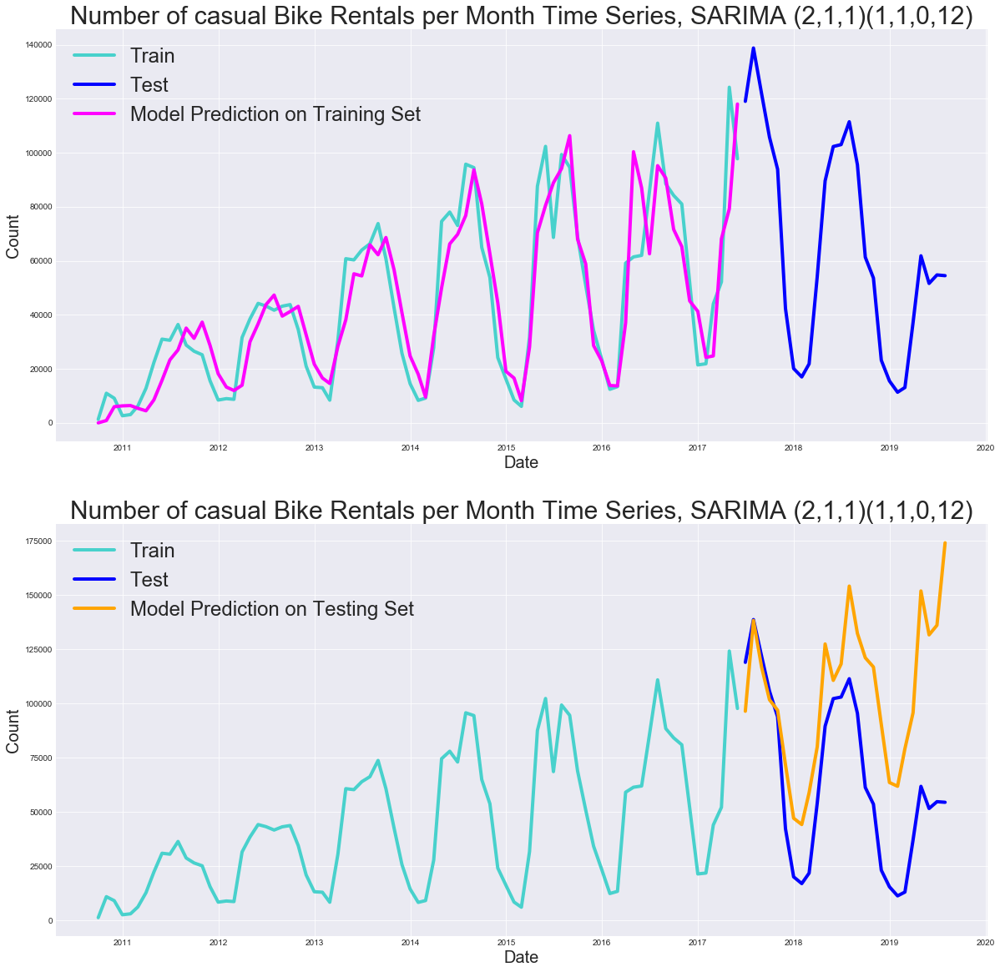

Orders: (2, 1, 1). Seasonal Orders: (0, 1, 1, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -774.568
Date:                            Wed, 30 Oct 2019   AIC                           1559.136
Time:                                    19:07:41   BIC                           1570.234
Sample:                                09-30-2010   HQIC                          1563.533
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5160      0.185     -2.786      0.005      -0.8

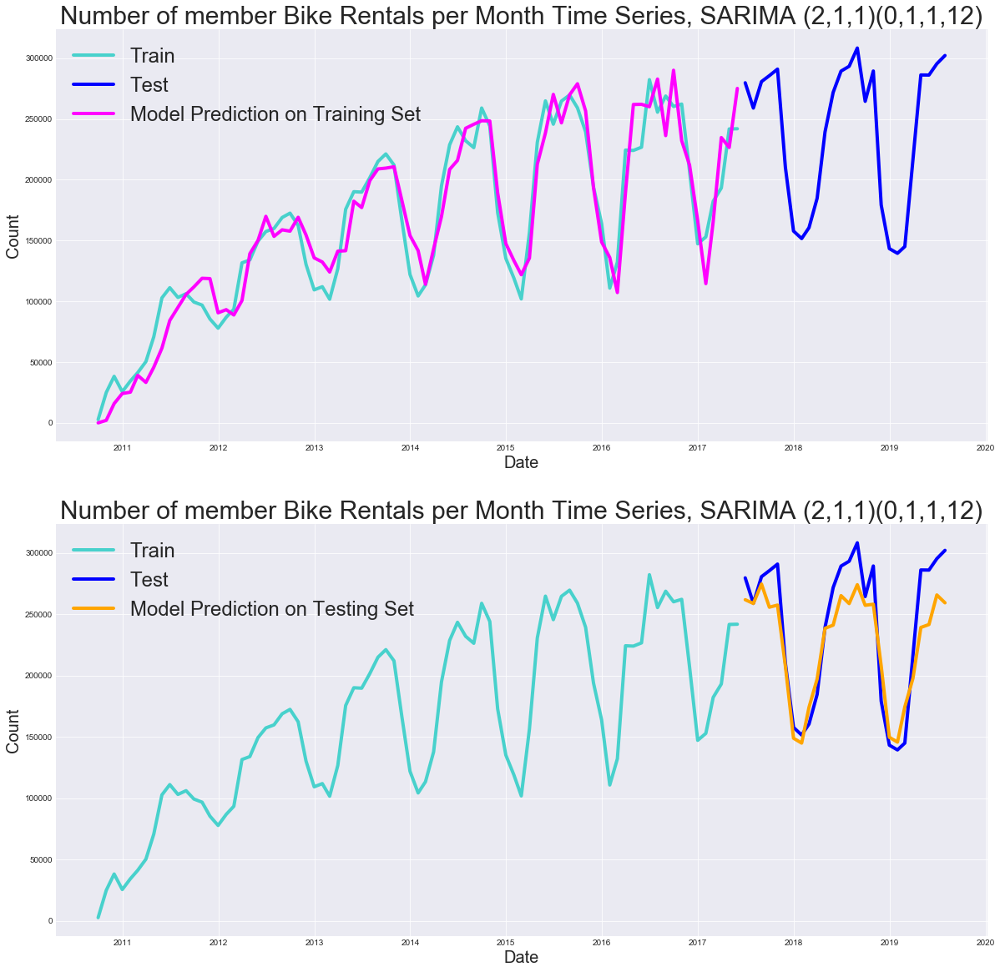

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -748.438
Date:                            Wed, 30 Oct 2019   AIC                           1506.876
Time:                                    19:07:42   BIC                           1517.973
Sample:                                09-30-2010   HQIC                          1511.273
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2589      0.117    -10.795      0.000      -1.487      -1.030
ar.L2         -0.3947      0.118   

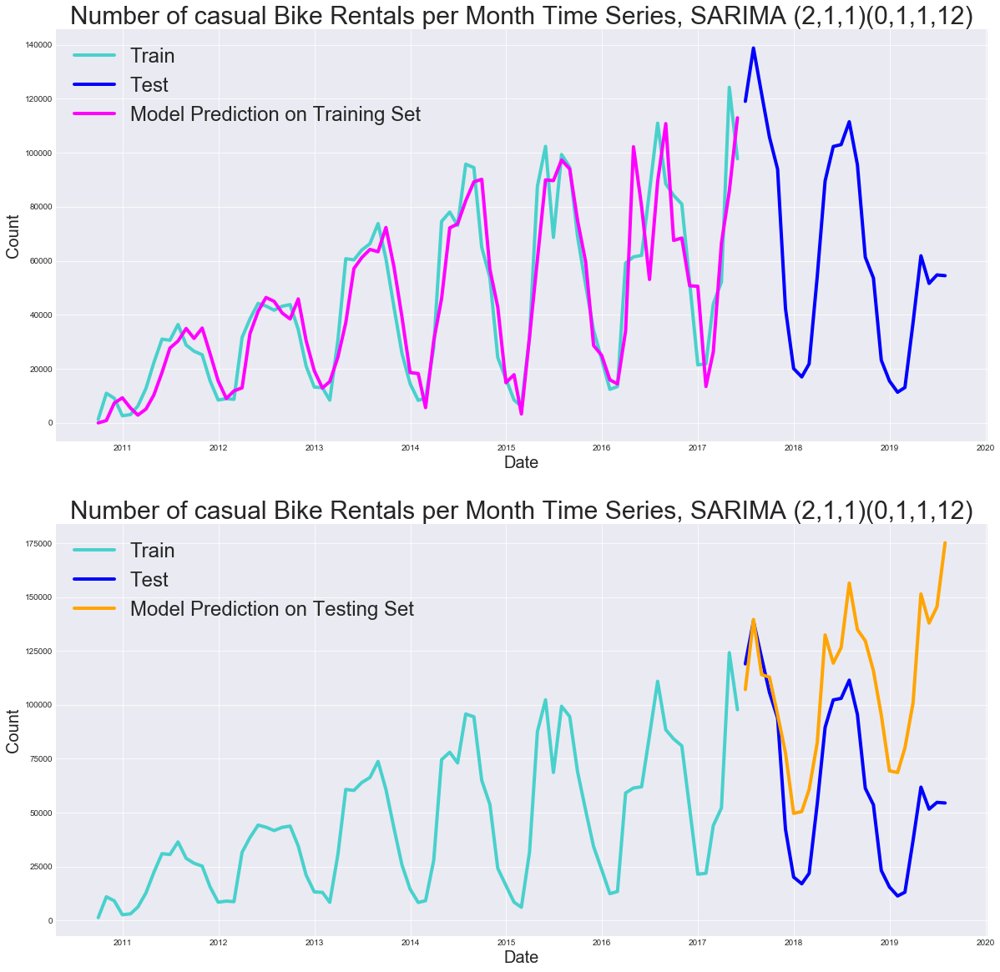

Orders: (2, 1, 2). Seasonal Orders: (0, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(0, 1, 0, 12)   Log Likelihood                -769.483
Date:                            Wed, 30 Oct 2019   AIC                           1548.966
Time:                                    19:07:43   BIC                           1560.064
Sample:                                09-30-2010   HQIC                          1553.363
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4138      0.072     -5.720      0.000      -0.5

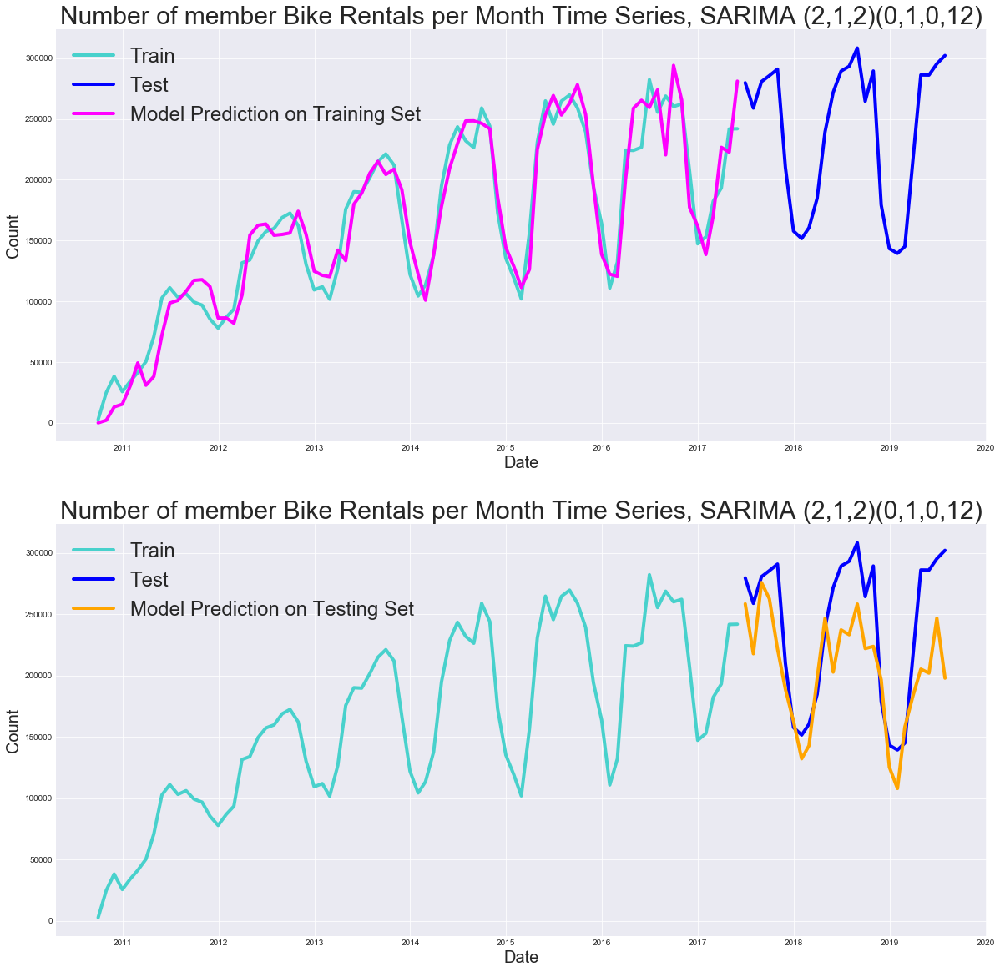

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(0, 1, 0, 12)   Log Likelihood                -747.991
Date:                            Wed, 30 Oct 2019   AIC                           1505.982
Time:                                    19:07:44   BIC                           1517.079
Sample:                                09-30-2010   HQIC                          1510.379
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3841      0.289     -1.327      0.185      -0.951       0.183
ar.L2         -0.6459      0.217   

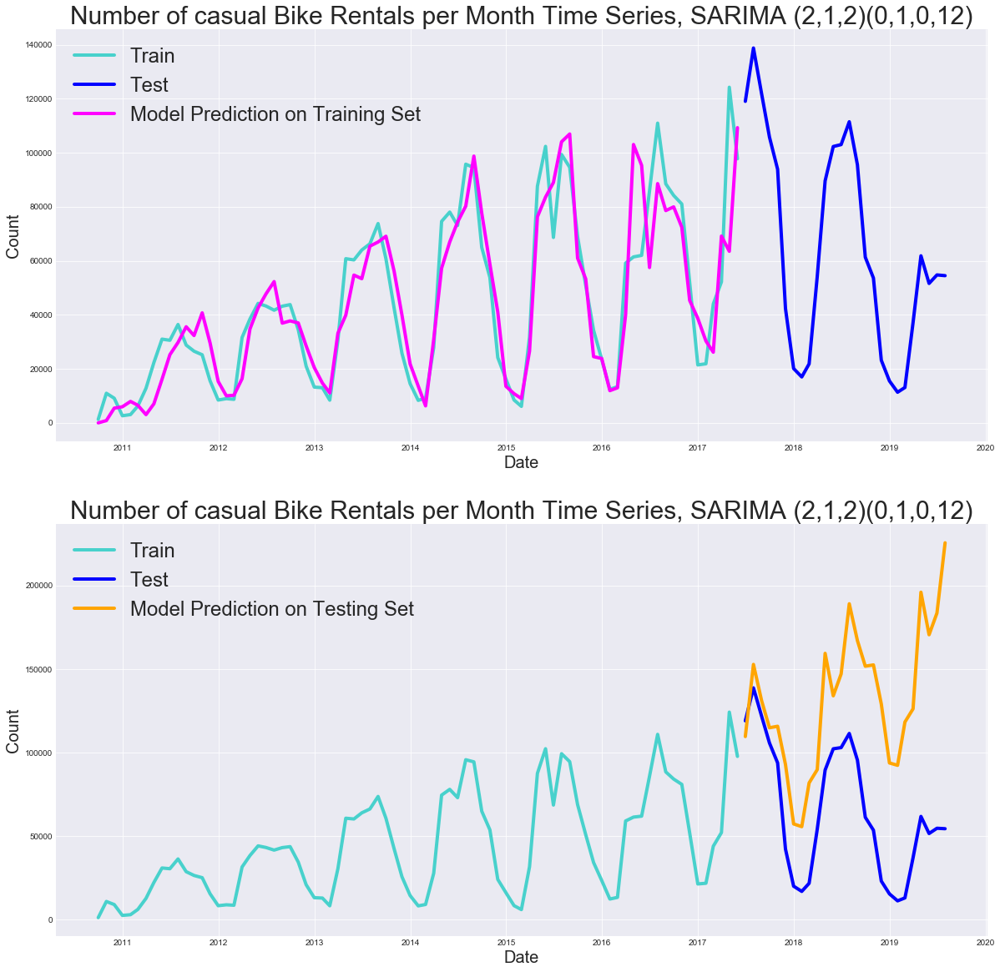

Orders: (2, 1, 2). Seasonal Orders: (1, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(1, 1, 0, 12)   Log Likelihood                -769.483
Date:                            Wed, 30 Oct 2019   AIC                           1550.966
Time:                                    19:07:46   BIC                           1564.283
Sample:                                09-30-2010   HQIC                          1556.243
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4138      0.073     -5.689      0.000      -0.5

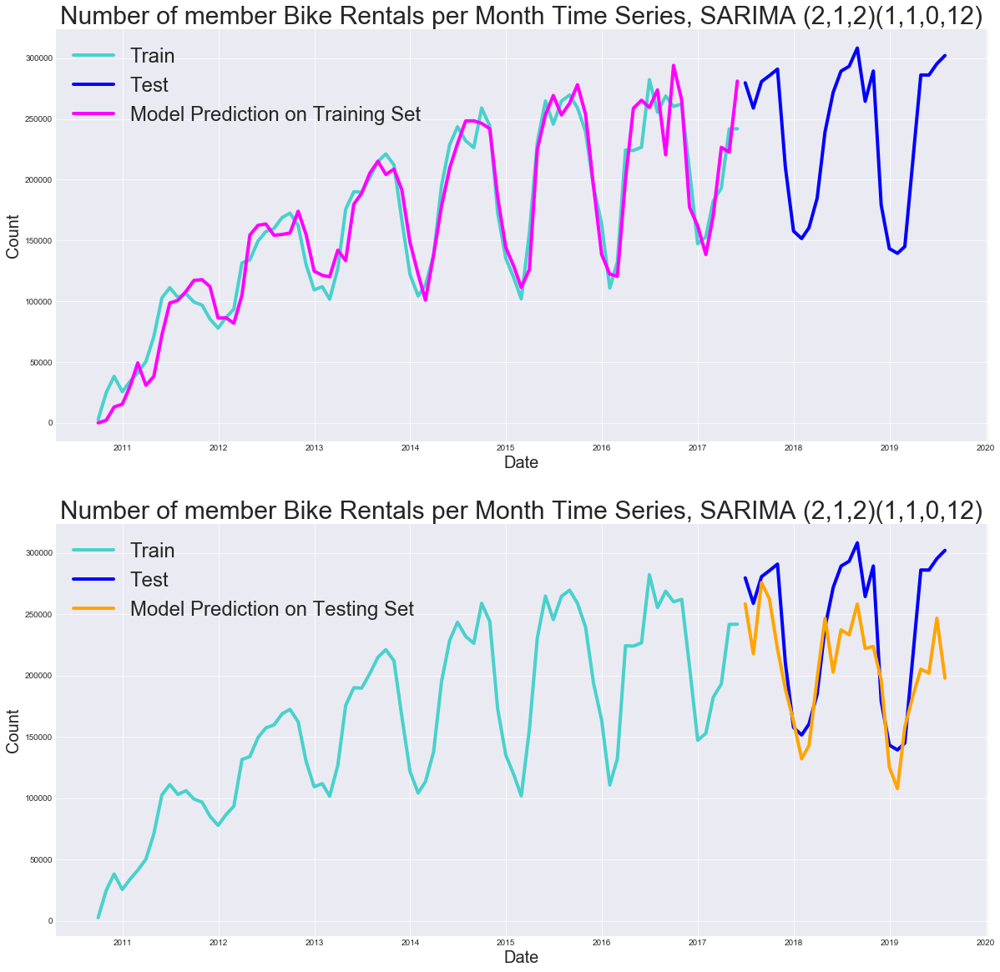

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(1, 1, 0, 12)   Log Likelihood                -744.883
Date:                            Wed, 30 Oct 2019   AIC                           1501.765
Time:                                    19:07:47   BIC                           1515.082
Sample:                                09-30-2010   HQIC                          1507.042
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1528      0.232      0.658      0.511      -0.303       0.608
ar.L2         -0.6274      0.199   

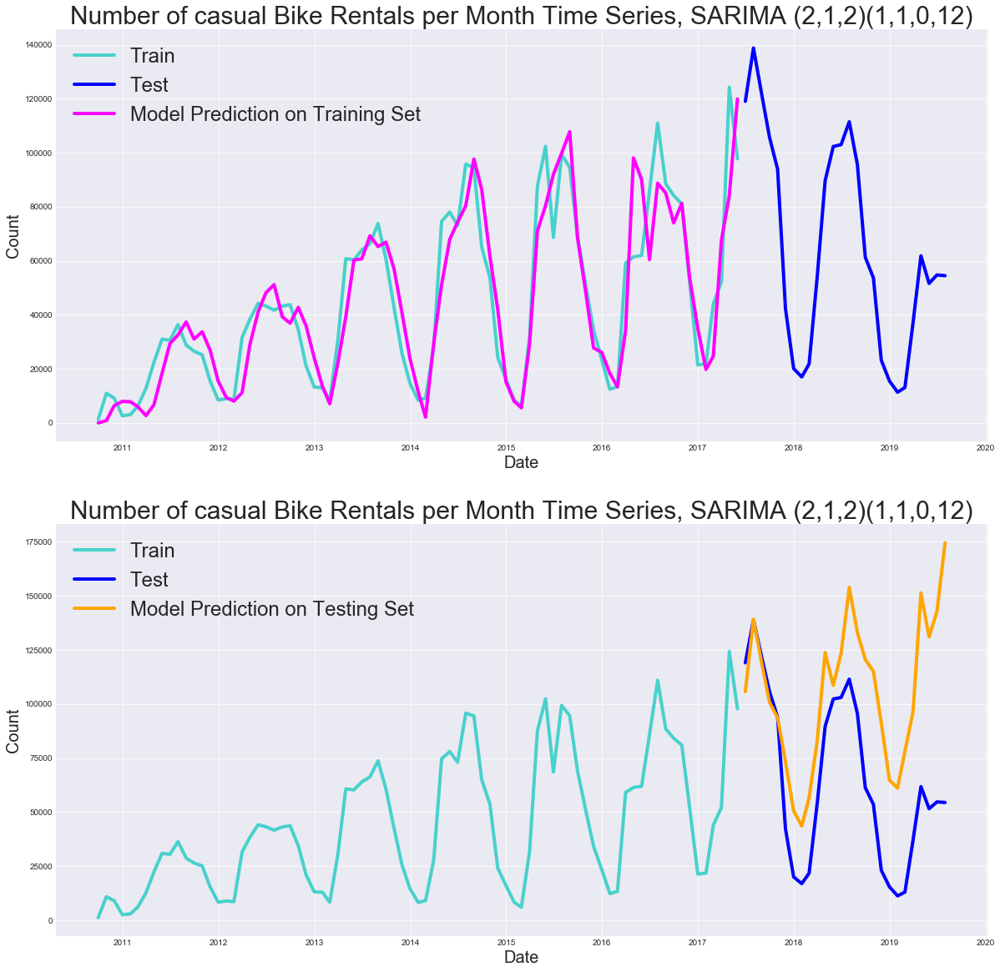

Orders: (2, 1, 2). Seasonal Orders: (0, 1, 1, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 12)   Log Likelihood                -769.483
Date:                            Wed, 30 Oct 2019   AIC                           1550.967
Time:                                    19:07:49   BIC                           1564.284
Sample:                                09-30-2010   HQIC                          1556.243
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4137      0.073     -5.678      0.000      -0.5

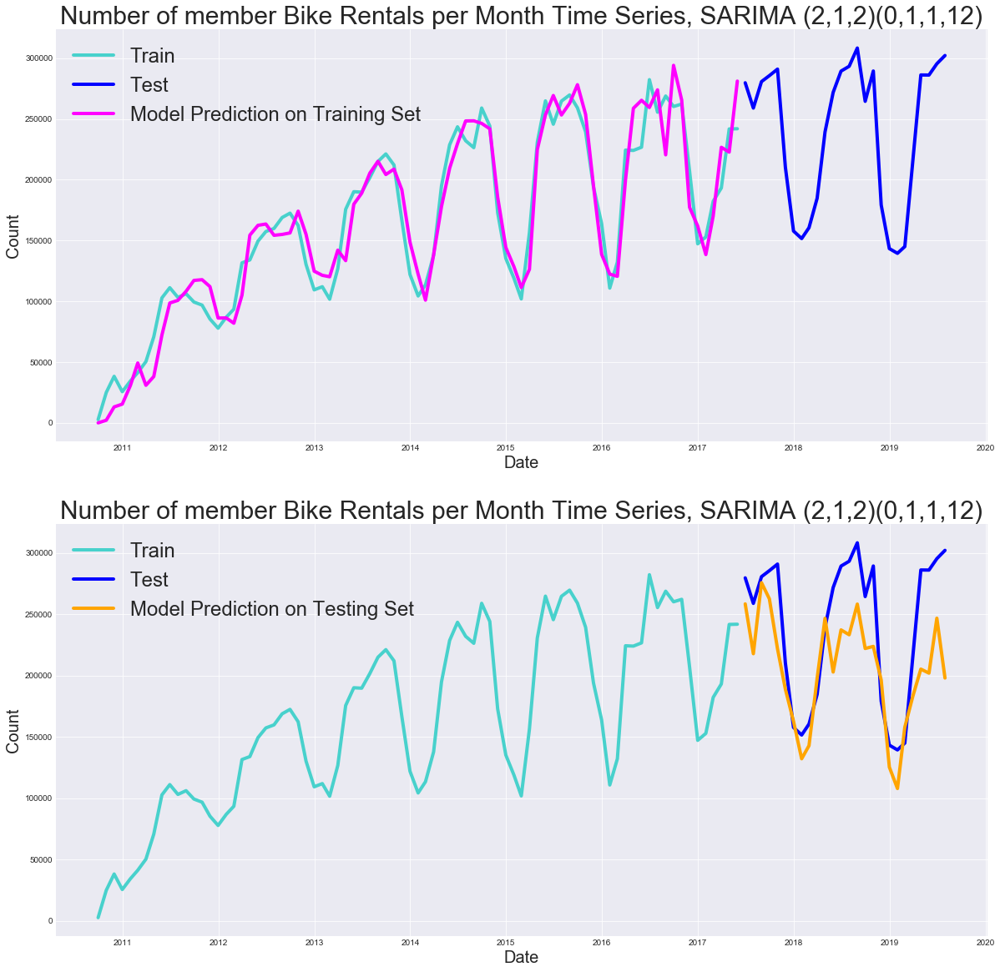

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 12)   Log Likelihood                -745.280
Date:                            Wed, 30 Oct 2019   AIC                           1502.561
Time:                                    19:07:50   BIC                           1515.878
Sample:                                09-30-2010   HQIC                          1507.838
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2131      0.174      1.225      0.220      -0.128       0.554
ar.L2         -0.6201      0.189   

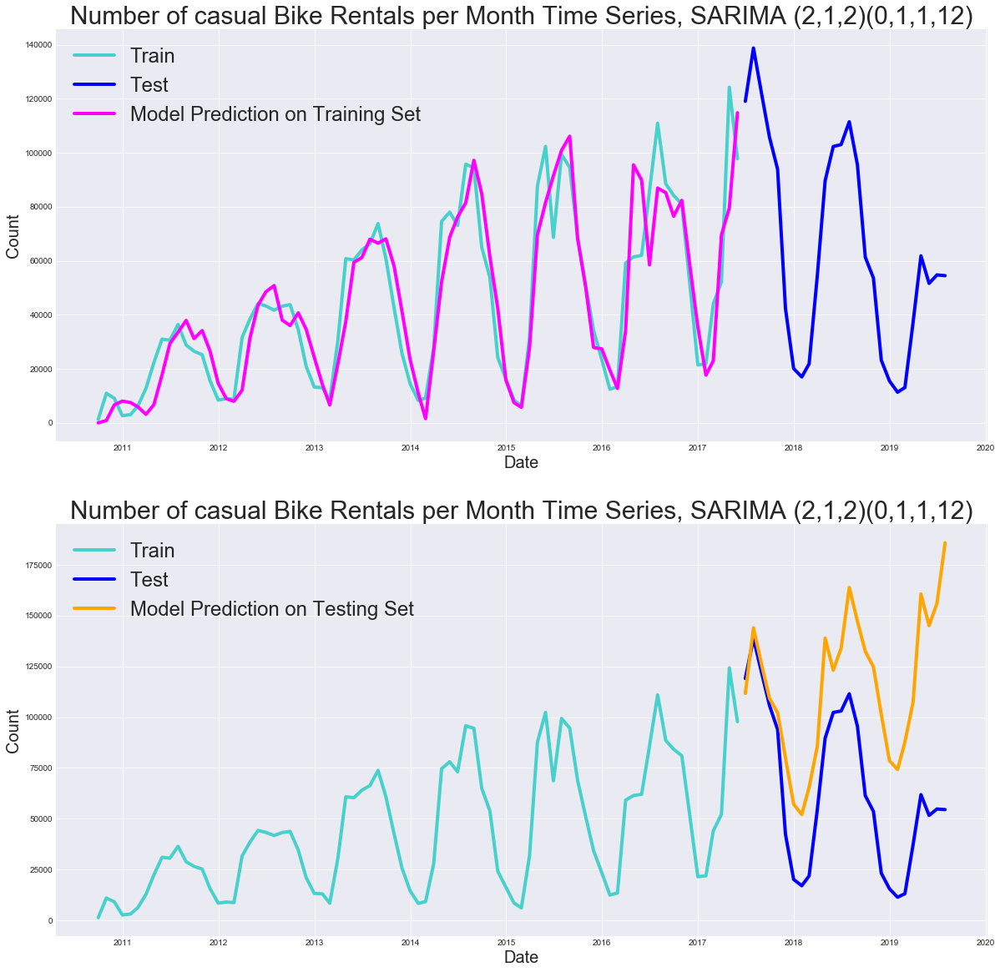

Orders: (2, 1, 3). Seasonal Orders: (0, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(0, 1, 0, 12)   Log Likelihood                -767.165
Date:                            Wed, 30 Oct 2019   AIC                           1546.329
Time:                                    19:07:51   BIC                           1559.646
Sample:                                09-30-2010   HQIC                          1551.606
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4914      0.033    -14.808      0.000      -0.5

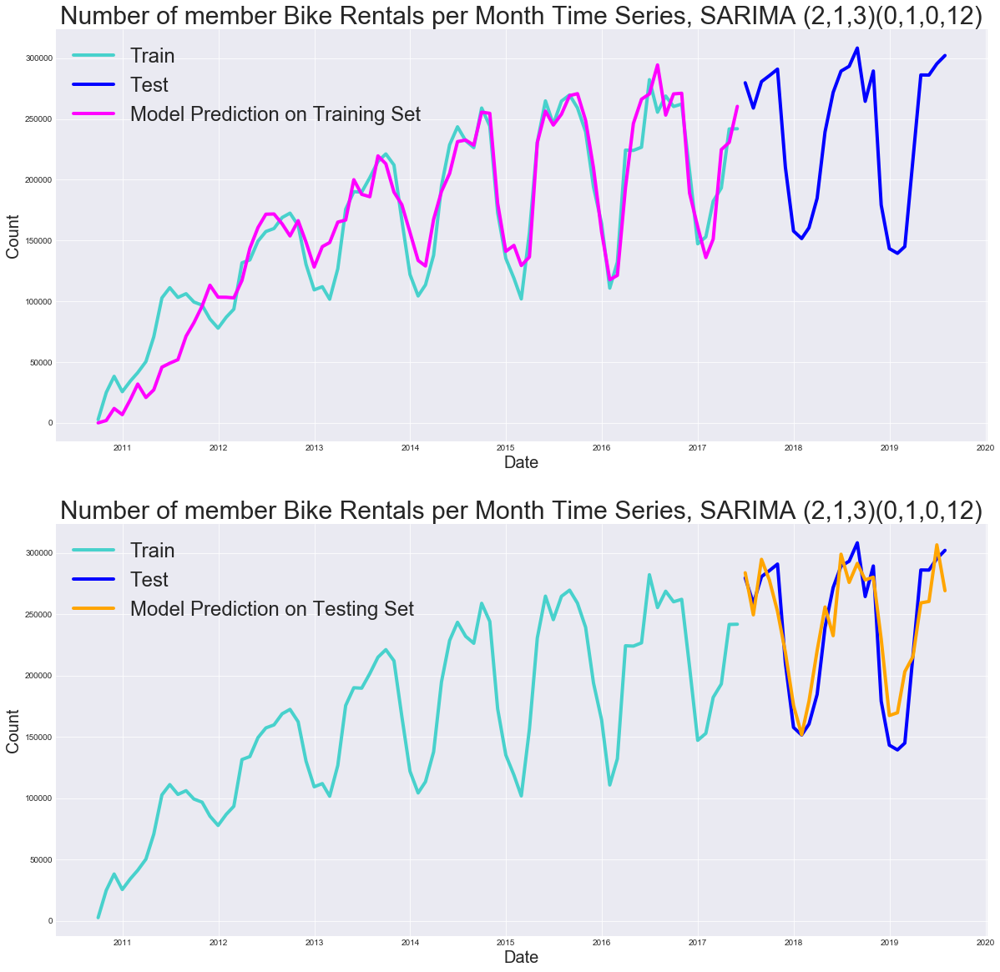

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(0, 1, 0, 12)   Log Likelihood                -742.460
Date:                            Wed, 30 Oct 2019   AIC                           1496.921
Time:                                    19:07:53   BIC                           1510.238
Sample:                                09-30-2010   HQIC                          1502.197
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6275      0.116     -5.429      0.000      -0.854      -0.401
ar.L2         -0.9517      0.115   

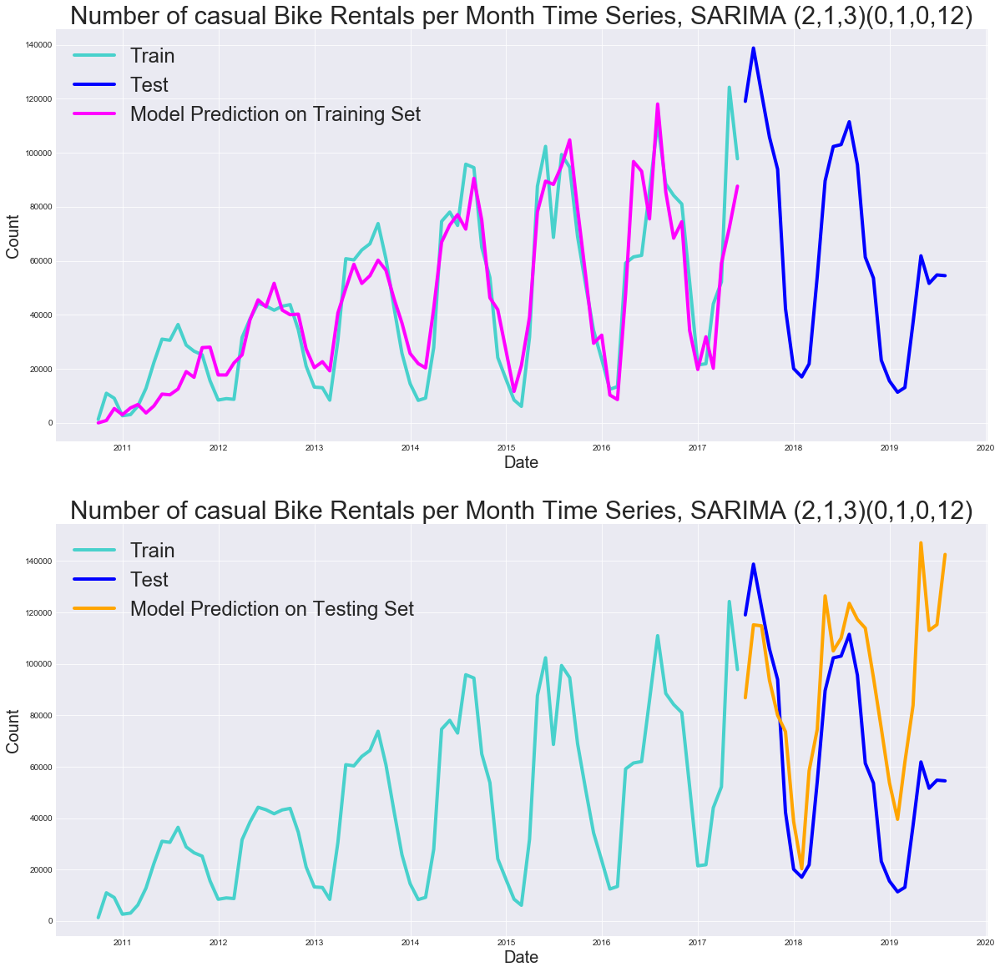

Orders: (2, 1, 3). Seasonal Orders: (1, 1, 0, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(1, 1, 0, 12)   Log Likelihood                -766.735
Date:                            Wed, 30 Oct 2019   AIC                           1547.471
Time:                                    19:07:54   BIC                           1563.007
Sample:                                09-30-2010   HQIC                          1553.627
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4906      0.033    -15.041      0.000      -0.5

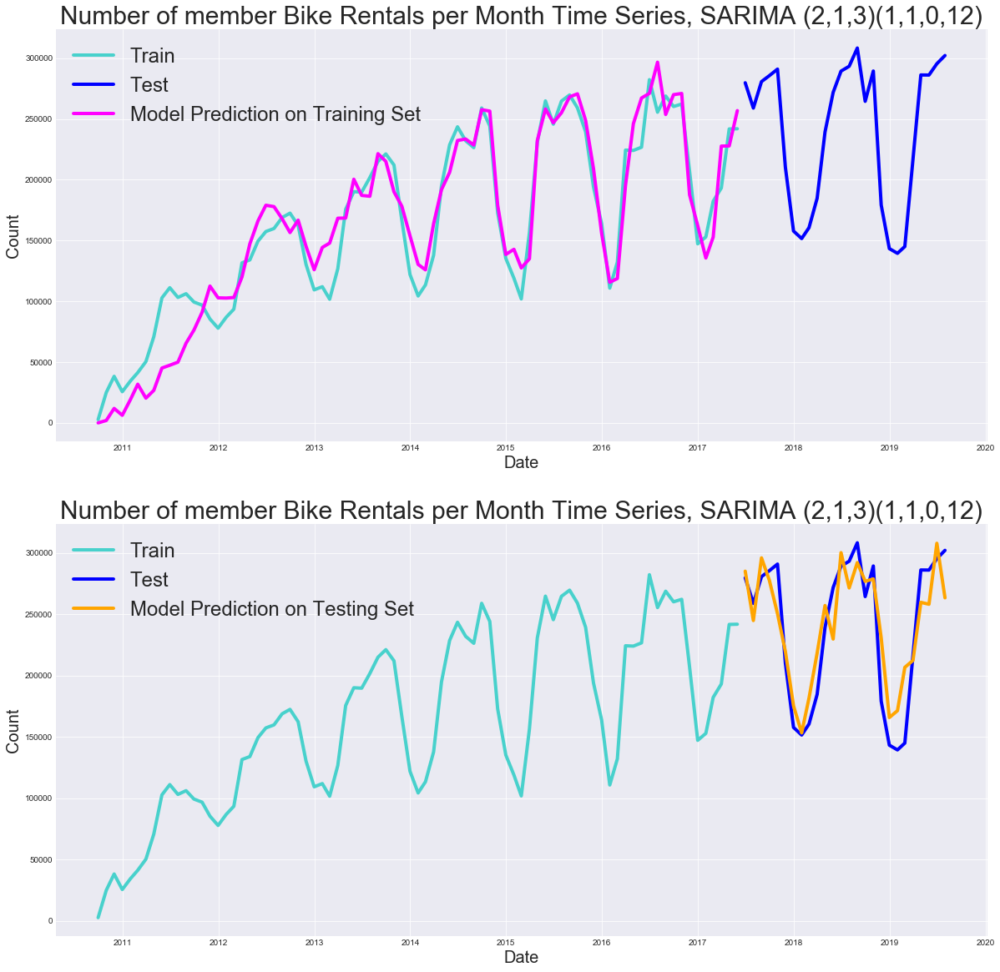

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(1, 1, 0, 12)   Log Likelihood                -742.034
Date:                            Wed, 30 Oct 2019   AIC                           1498.067
Time:                                    19:07:56   BIC                           1513.604
Sample:                                09-30-2010   HQIC                          1504.223
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6332      0.146     -4.333      0.000      -0.920      -0.347
ar.L2         -0.9262      0.146   

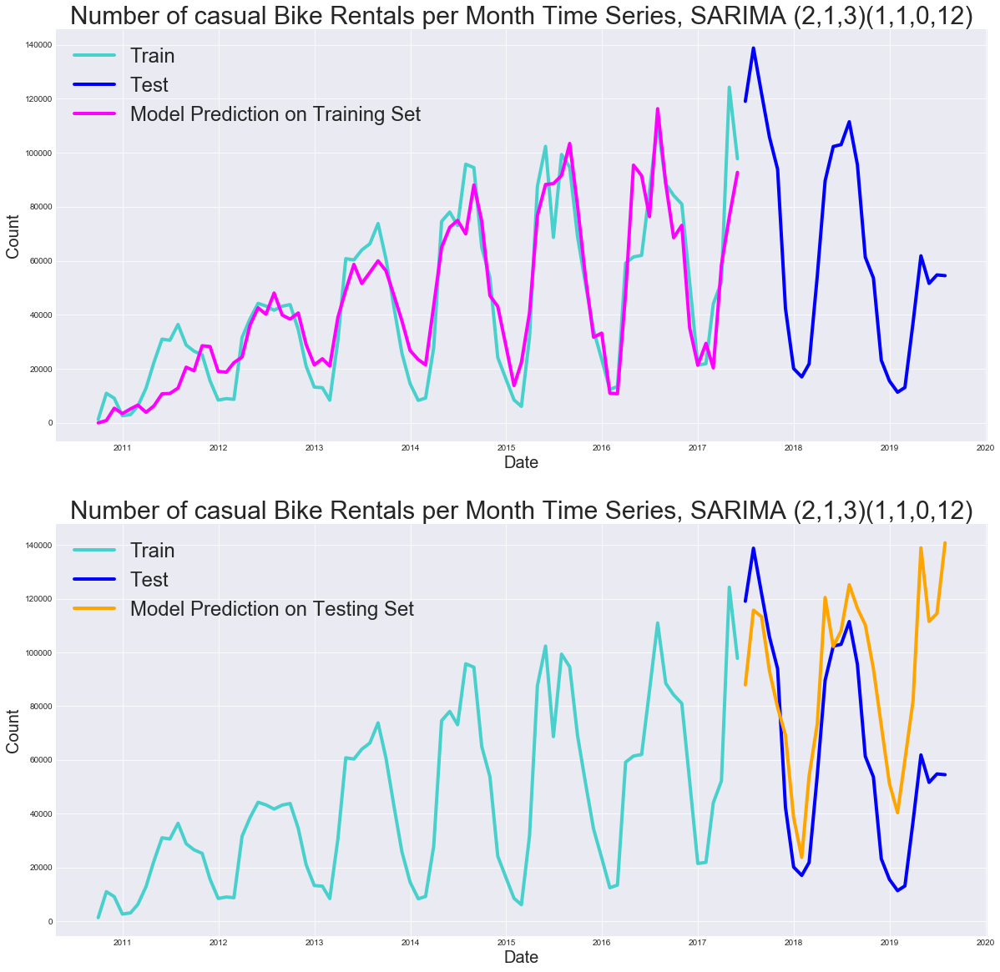

Orders: (2, 1, 3). Seasonal Orders: (0, 1, 1, 12)
                                 Statespace Model Results                                 
Dep. Variable:                             member   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(0, 1, 1, 12)   Log Likelihood                -766.604
Date:                            Wed, 30 Oct 2019   AIC                           1547.208
Time:                                    19:07:58   BIC                           1562.744
Sample:                                09-30-2010   HQIC                          1553.364
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4911      0.032    -15.184      0.000      -0.5

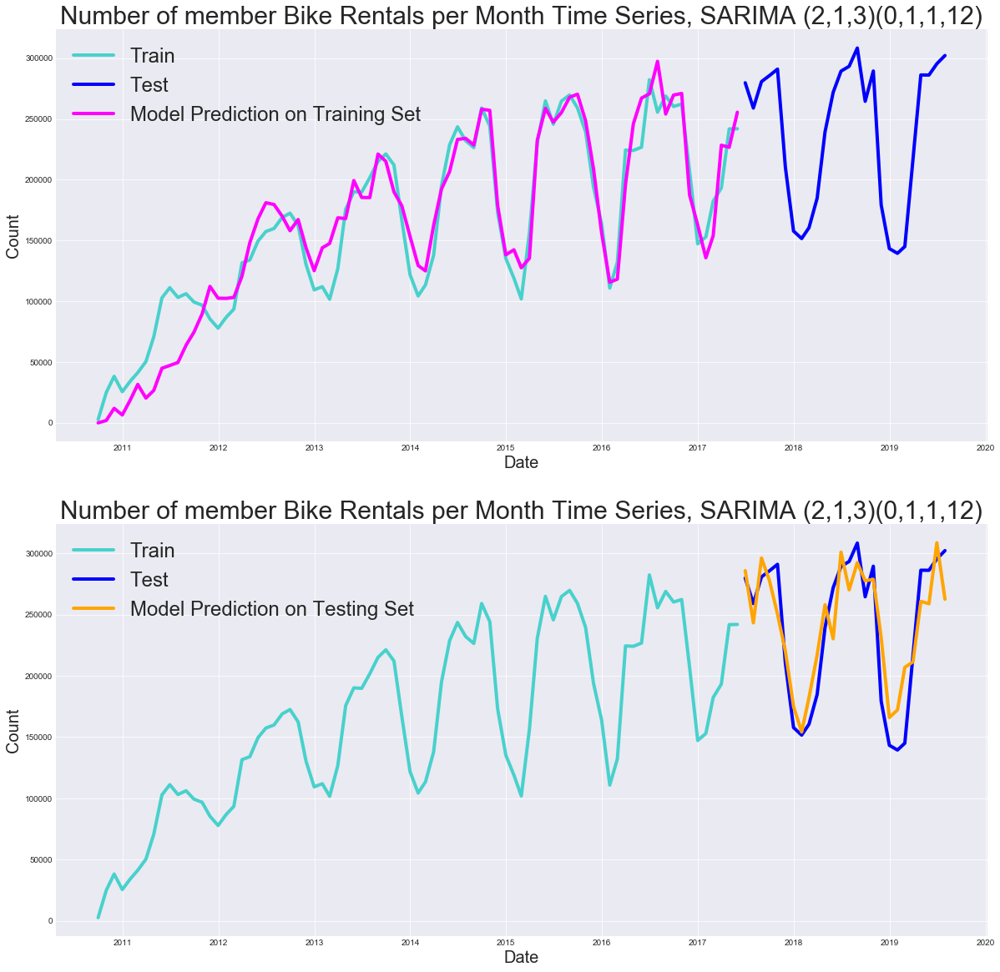

                                 Statespace Model Results                                 
Dep. Variable:                             casual   No. Observations:                   81
Model:             SARIMAX(2, 1, 3)x(0, 1, 1, 12)   Log Likelihood                -745.053
Date:                            Wed, 30 Oct 2019   AIC                           1504.106
Time:                                    19:08:00   BIC                           1519.642
Sample:                                09-30-2010   HQIC                          1510.262
                                     - 05-31-2017                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1643      0.265      0.620      0.535      -0.355       0.684
ar.L2         -0.6002      0.233   

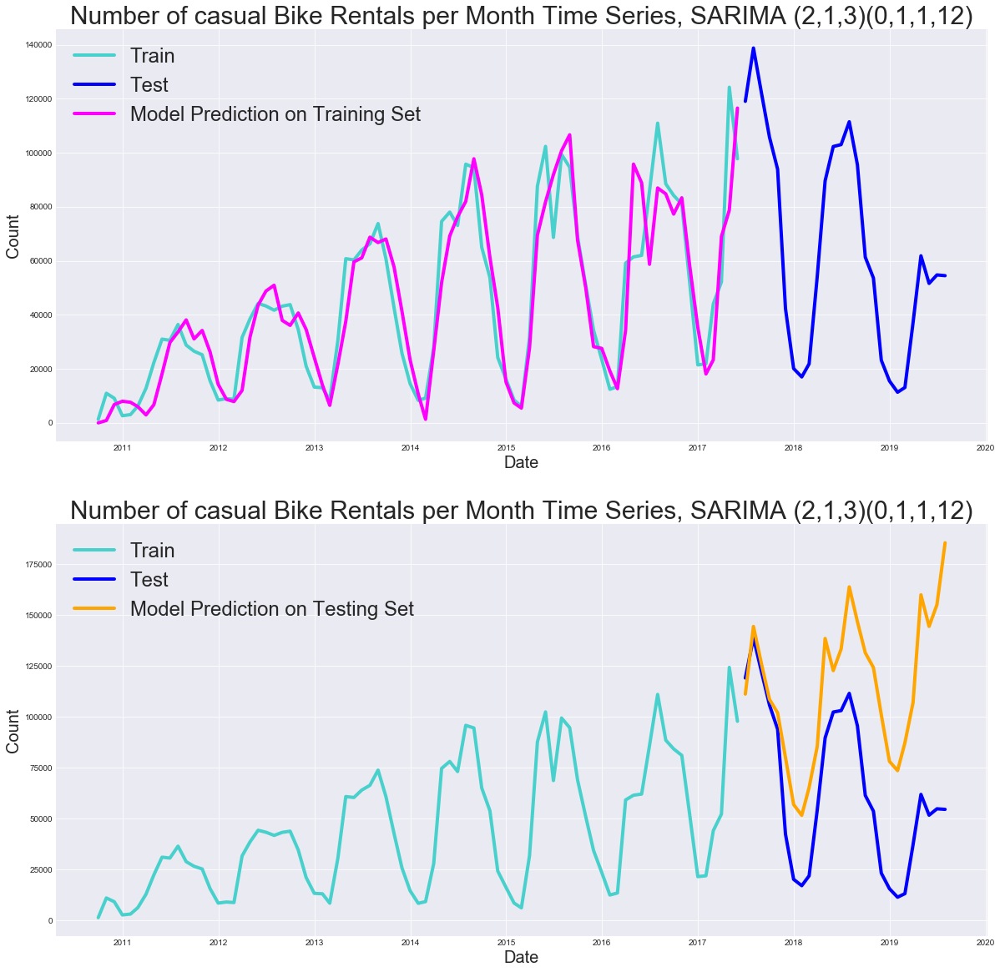

In [23]:
dt.sarima_breakdown(breakdown_train, breakdown_test)

We can get good fit for the member data, but the casual use data has a sudden recent dip in rentals, which is hard to build a time series model on without more data. We will try with (2,1,3) (0,1,0,12) for Members and (2,1,2)(0,1,1,12) for Casual rides.

In [24]:
members_213_01012 = sm.tsa.statespace.SARIMAX(bike_rental_type['member'], order=(2, 1, 3),
                                              seasonal_order=(0, 1, 0, 12)).fit()
members_213_01012.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                             member   No. Observations:                  107
Model:             SARIMAX(2, 1, 3)x(0, 1, 0, 12)   Log Likelihood               -1064.549
Date:                            Wed, 30 Oct 2019   AIC                           2141.097
Time:                                    19:08:01   BIC                           2156.357
Sample:                                09-30-2010   HQIC                          2147.261
                                     - 07-31-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5220      0.036    -14.378      0.000      -0.593      -0.451
ar.L2         -0.9622      0.046    -20.914      0.000      -1.052      -0.872
ma.L1         -0.1963      0.075     -2.613      0.009      -0.344      -0.049
ma.L2          0.4205      0.118      3.557      0.000       0.189       0.652
ma.L3         -0.8415      0.143     -5.881      0.000      -1.122      -0.561
sigma2      4.607e+08    1.2e-10   3.84e+18      0.000    4.61e+08    4.61e+08
===================================================================================
Ljung-Box (Q):                       79.71   Jarque-Bera (JB):                 0.66
Prob(Q):                              0.00   Prob(JB):                         0.72
Heteroskedasticity (H):               1.23   Skew:                             0.06
Prob(H) (two-sided):                  0.57   Kurtosis:                         2.61
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.39e+35. Standard errors may be unstable.
"""

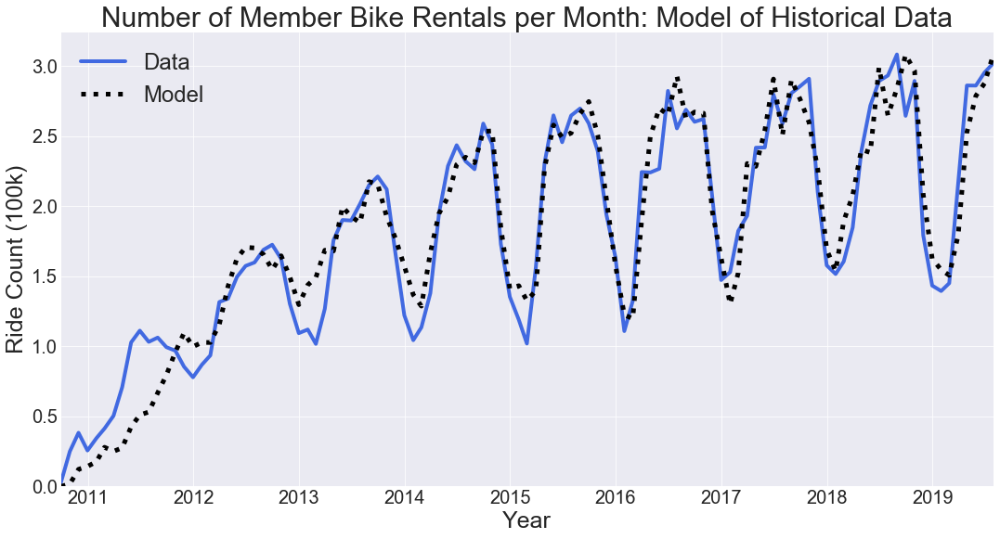

In [25]:
p.model_plot_breakdown(members_213_01012, bike_rental_type, kind='Member')

In [26]:
casual_212_01112 = sm.tsa.statespace.SARIMAX(bike_rental_type['casual'], order=(2, 1, 2),
                                             seasonal_order=(0, 1, 1, 12)).fit()
casual_212_01112.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                             casual   No. Observations:                  107
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 12)   Log Likelihood               -1029.449
Date:                            Wed, 30 Oct 2019   AIC                           2070.898
Time:                                    19:08:02   BIC                           2086.158
Sample:                                09-30-2010   HQIC                          2077.062
                                     - 07-31-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3905      0.184      2.118      0.034       0.029       0.752
ar.L2         -0.6174      0.204     -3.033      0.002      -1.016      -0.218
ma.L1         -0.6917      0.131     -5.279      0.000      -0.949      -0.435
ma.L2          0.8461      0.134      6.328      0.000       0.584       1.108
ma.S.L12      -0.5175      0.120     -4.313      0.000      -0.753      -0.282
sigma2       2.47e+08    3.9e-10   6.33e+17      0.000    2.47e+08    2.47e+08
===================================================================================
Ljung-Box (Q):                       45.66   Jarque-Bera (JB):                 3.34
Prob(Q):                              0.25   Prob(JB):                         0.19
Heteroskedasticity (H):               2.15   Skew:                             0.40
Prob(H) (two-sided):                  0.04   Kurtosis:                         3.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.55e+33. Standard errors may be unstable.
"""

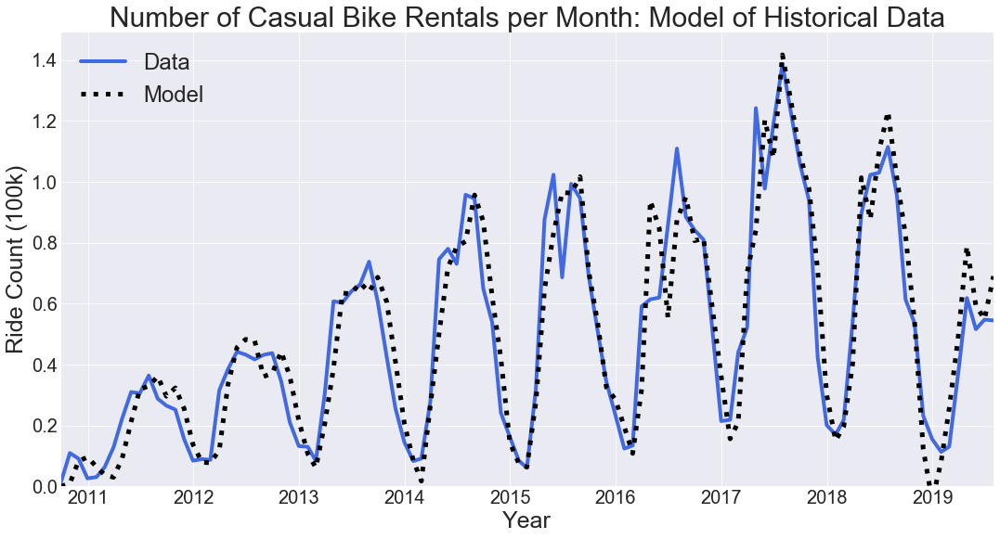

In [27]:
p.model_plot_breakdown(casual_212_01112, bike_rental_type, kind='Casual')

As you can see, the p-values of both are very low, indicating a close correlation between the models and the actual data. In addition, we can see a very clear difference in volume between member and casual rentals.

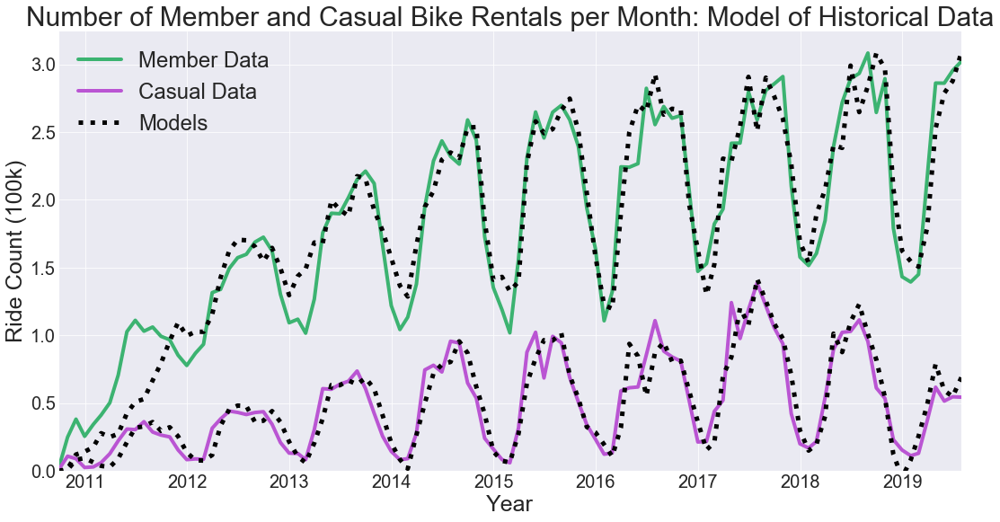

In [28]:
p.model_plot_breakdown_both(
    members_213_01012, casual_212_01112, bike_rental_type)

Now, we will conduct forecasts for both datasets.

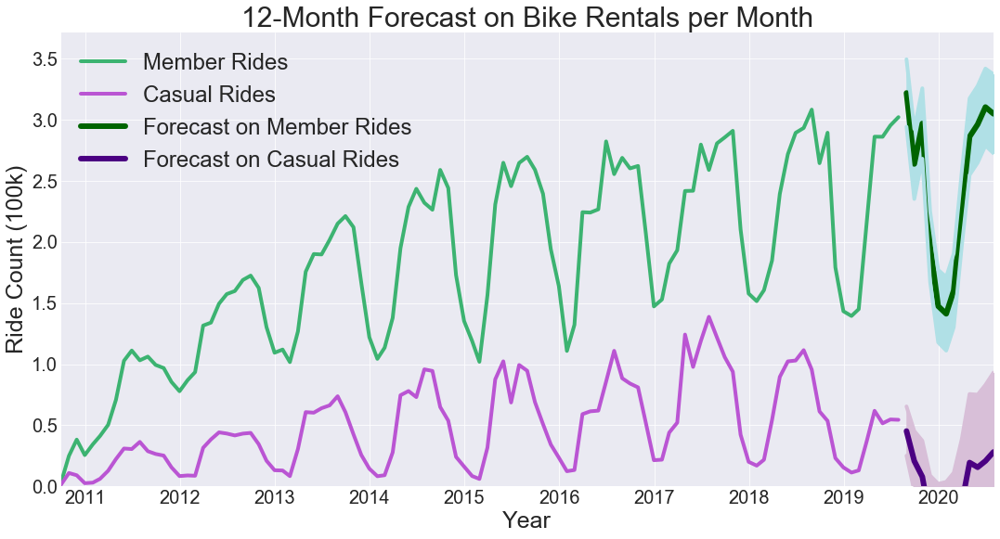

In [29]:
p.forecast_plot_breakdown_both(
    members_213_01012, casual_212_01112, bike_rental_type, 12)

As we can see, the size of the prediction interval shrinks for the member rentals, and the prediction appears to level out. This indicates that, while the usage is not projected to increase  substantially for members, it is not projected to decrease  substantially either. However, for the casual riders, we see that the predicted usage drops below zero. This is an indicator that the time series, as it is, is still too random to provide stable predictions for this part of the dataset. The industry for casual usage, however, does appear to be in decline.

Based on this prediction, since bicycle usage is not projected to increase substantially in the next year, we can determine that Capital Bikeshare has a sufficient number of bicycles to operate over the next 12 months.